# The Spread of COVID-19 in the Philippines and its effects on the Philippine Stock Market

This Project examined trends in the Philippine Stock Market during the first two quarters of the Covid 19 pandemic in the top 5 regions of the country based on gross domestic product (GDP) per capita. An examination was also done on the trends of the Covid 19 cases over time and the quarantine measures imposed in the regions. A correlation was then done between the mean share prices of the different sectors in the PSEi and the mean Covid cases in the first two quarters.

Covid-19 is a major public health issue that affects millions of people around the world. Recognized as having one of the longest lockdowns in the world, the government’s response to the pandemic has also brought along economic repercussions. As the virus spread, the government and businesses are faced with a tough decision on how to balance economic demands and public health concerns. In deciding how to strike an intricate balance, we have to decipher the relationship of the markets and covid-19 cases. We used the Philippine Stock Market as a proxy to the collective business sentiment towards the economy. Although a case can be made that the stock market, from time-to-time, may deviate from the underlying fundamentals of the business they represent, we will assume for this project that the Philippine market is a rational reflection of the economy and its prospects. We used reported active cases as metric for the Philippine Covid situation and quarantine measures for the government’s response. 

By examining the trends in the economy and covid-19, this will help decision makers prioritize healthcare responses and balance these with economic decisions. This will establish how intertwined our handling of the pandemic and the country’s economy.  Should decision makers address each issue independently? Can we decouple our response to the pandemic and the economy? Or should we have an integrated solution since the economy and our effectiveness in addressing the pandemic are connected?

### Collaborators:
- Benolirao, John Adriel T.
- Bilango, Jen
- Gulayan, Divina

## A. Define Modules, Global Variables and Utility Functions

### I. Import Modules

In [1]:
import os
import pandas as pd
import numpy as np
import datetime
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
from shapely.geometry import Point

plt.style.use('seaborn-darkgrid')

%pylab inline

Populating the interactive namespace from numpy and matplotlib


### II. Define Global Variables

In [2]:
# Define colors
global_figsize_all = (15,75)
global_figsize_sectors = (10,30)
global_line_color = "#FF8900"
global_title_color = '#575757'
global_rect_all = [0, 0, 1, 0.96]
global_rect_sectors = [0, 0, 1, 0.97]
global_rect_sectors2 = [0, 0, 1, 0.96]
global_rect_sectors3 = [0, 0, 1, 0.95]
global_q_color = '#FF5757'

### III. Define Utility Functions

In [3]:
# Define Functions

# Define generic plotter
def generic_plotter(df, title, x_label=None, y_label=None, kind='line', x_lim=None, y_lim=None, figsize=(15, 10), title_fontcolor='#575757', title_fontsize=20, label_fontsize=16, legend_loc='lower left', **kwargs):
    ax = df.plot(kind=kind, figsize=figsize, **kwargs)
    if title_fontcolor is None:
        ax.set_title(title, fontsize=title_fontsize)
    else:
        ax.set_title(title, fontsize=title_fontsize, color=title_fontcolor)
    if x_label is not None:
        ax.set_xlabel(x_label, fontsize=label_fontsize)
    if y_label is not None:
        ax.set_ylabel(y_label, fontsize=label_fontsize)
    if 'legend' not in kwargs:
        ax.legend(loc=legend_loc)
    elif kwargs['legend'] == True:
        ax.legend(loc=legend_loc)
    if x_lim is not None:
        ax.set_xlim(x_lim)
    if y_lim is not None:
        ax.set_ylim(y_lim)
    return ax
    
def extract_sector(sector):
    headers = []
    for d in stocks_info_dict.values():
        if d['sector'] == sector:
            headers.append(d['pse_code'])
    return df_pse_shareprice[headers]

# Define normalizer function
def normalize_df(df):
    # Get Max; Divide 100 by max; Multiply from obtained data (for normalization)
    for col in df.columns:
        ratio = 100 / df.max()
        df = df.mul(ratio)
    return df

# Define indiv_sector_plotter
def indiv_sector_plotter(my_dict, key, title=None, **kwargs):
    if title is None:
        title = f'{key} Sector Mean and Median of Blue Chip Share Prices'
    return generic_plotter(my_dict[key], title, 'Date', 'Share Price', **kwargs)
    
# extract_first_2_quarters
def extract_first_2_quarters(df):
    # Extract first 2 quarters only then renormalize
    return df[(df.index.date > datetime.date(2019,12,31)) & (df.index.date < datetime.date(2020,7,1))]

def generate_covid_shareprice_data(df_shares, pse_code, df_covid):
    df = df_shares[[pse_code]].copy()
    df['Covid-19 Daily Reported Cases'] = df_covid
    # print(df.head(50))
    return df

def generate_quarantine_shareprice_data(df_shares, pse_code, df_q_mode):
    df = df_shares[[pse_code]].copy()
    df['Quarantine Measures'] = df_q_mode
    # print(df.head(50))
    return df

def scatterplot_all_sectors(df_temp, title, x_label, x_col, x_lim=[-10,110], y_lim=[-10,110], alpha=0.5, legend_loc='upper right'):
    ax = generic_plotter(df_temp,
    title,
    x_label,
    'Normalized Share Price',
    x_lim=x_lim,
    y_lim=y_lim,
    kind='scatter',
    x=x_col,
    y='Financials',
    label='Financials Sector Daily Data',
    color="red",
    alpha=alpha)

    ax = generic_plotter(df_temp,
    title,
    x_label,
    'Normalized Share Price',
    ax=ax,
    x_lim=x_lim,
    y_lim=y_lim,
    kind='scatter',
    x=x_col,
    y='Industrial',
    label='Industrial Sector Daily Data',
    color="Orange",
    alpha=alpha)

    ax = generic_plotter(df_temp,
    title,
    x_label,
    'Normalized Share Price',
    ax=ax,
    x_lim=x_lim,
    y_lim=y_lim,
    kind='scatter',
    x=x_col,
    y='Industrial',
    label='Holding Sector Daily Data',
    color="Green",
    alpha=alpha)

    ax = generic_plotter(df_temp,
    title,
    x_label,
    'Normalized Share Price',
    ax=ax,
    x_lim=x_lim,
    y_lim=y_lim,
    kind='scatter',
    x=x_col,
    y='Services',
    label='Services Sector Daily Data',
    color="Blue",
    alpha=alpha)

    ax = generic_plotter(df_temp,
    title,
    x_label,
    'Normalized Share Price',
    ax=ax,
    x_lim=x_lim,
    y_lim=y_lim,
    kind='scatter',
    x=x_col,
    y='Services',
    label='Mining and Oil Sector Daily Data',
    color="Yellow",
    alpha=alpha)

    ax = generic_plotter(df_temp,
    title,
    x_label,
    'Normalized Share Price',
    ax=ax,
    x_lim=x_lim,
    y_lim=y_lim,
    kind='scatter',
    x=x_col,
    y='Property',
    label='Property Sector Daily Data',
    legend_loc=legend_loc,
    color="Pink",
    alpha=alpha)
    
    return ax

def set_quarantine_mode_index(ax, with_label=True):
    secax = ax.secondary_yaxis('right')
    if with_label:
        secax.set_ylabel('Quarantine Measures', fontsize=16)
    secax.set_yticks([0, 25, 50, 75, 100])
    secax.set_yticklabels(['None', 'MGCQ', 'GCQ', 'MECQ', 'ECQ'])
    
    return ax

def set_quarantine_mode_scatter_index(ax, fontsize=16, with_label=True):
    if with_label:
        ax.set_xlabel('Quarantine Measures', fontsize=fontsize)
    ax.set_xticks([0, 25, 50, 75, 100])
    ax.set_xticklabels(['None', 'MGCQ', 'GCQ', 'MECQ', 'ECQ'])
    
    return ax

def corrcoeff_plotter(yticks, yticklabels, title, title_fontsize, figsize, title_color, label_fontsize, x_label, y_label):
    ax = df_temp.plot(kind='barh', figsize=figsize, color=global_line_color, legend=False)
    ax.set_title(title, fontsize=title_fontsize, color=title_color)
    ax.set_xlabel(x_label, fontsize=label_fontsize)
    ax.set_ylabel(y_label, fontsize=label_fontsize)
    ax.set_xlim([-1, 1])
    ax.set_yticks(yticks)
    ax.set_yticklabels(yticklabels)
    return ax

def bar_plotter(xticks, xticklabels, title, title_fontsize, figsize, title_color, label_fontsize, x_label, y_label, plot_color=global_line_color):
    ax = df_temp.plot(kind='bar', figsize=figsize, color=plot_color, legend=False)
    ax.set_title(title, fontsize=title_fontsize, color=title_color)
    ax.set_xlabel(x_label, fontsize=label_fontsize)
    ax.set_ylabel(y_label, fontsize=label_fontsize)
    # ax.set_xlim([-1, 1])
    ax.set_xticks(xticks)
    ax.set_xticklabels(xticklabels)
    return ax

## B. Load and Visualize Philippines Stock Exchange Index (PSEi) Blue Chip Share Prices

### I. Load PSEi Blue Chip Demographic Data

In [4]:
# Read Stock info

df_pse_stocks_info = pd.read_csv('datasets/PSE Blue Chip Info.csv', dtype={'name': 'object', 'pse_code': 'object', 'sector': 'category'})
df_pse_stocks_info

,name,pse_code,sector
0,Bloomberry Resorts Corporation,BLOOM,Services
1,Aboitiz Power Corporation,AP,Industrial
2,Ayala Corporation,AC,Holding
3,"Aboitiz Equity Ventures, Inc.",AEV,Holding
4,"Alliance Global Group, Inc.",AGI,Holding
5,"Ayala Land, Inc.",ALI,Property
6,"BDO Unibank, Inc.",BDO,Financials
7,Bank of the Philippine Islands,BPI,Financials
8,"DMCI Holdings, Inc.",DMC,Holding
9,First Gen Corporation,FGEN,Industrial


#### a. Define Stocks Demography Dictionary

This dictionary will be used to wrangle Blue Chip Share Prices.

In [5]:
# Define stocks_info_dict

stocks_info_dict = {}
for _, row in df_pse_stocks_info.iterrows():
    stocks_info_dict[row['pse_code']] = {
        'name': row['name'],
        'pse_code': row['pse_code'],
        'sector': row['sector'],
        'shareprice_col': f"{row['name']} (PSE:{row['pse_code']}) - Share Pricing"
    }

### II. Extract and wrangle **Blue Chip Shareprice.csv** 

Will rename columns of **Blue Chip Shareprice.csv** from the format *{name} (PSE:{pse_code}) - Share Pricing* to *pse_code*.

In [6]:
# Read Shareprice Data

dtype_dict = {}
for d in stocks_info_dict.values():
    dtype_dict[d['shareprice_col']] = 'float16'
    
df_pse_shareprice = pd.read_csv('datasets/Blue Chip Shareprice.csv', dtype=dtype_dict)



# Perform Wrangling

# Convert Dates column to date
df_pse_shareprice['Dates'] = pd.to_datetime(df_pse_shareprice['Dates'])

# print(df_pse_shareprice.head())

# Rename columns
new_col_names = {}
for key in stocks_info_dict.keys():
    new_col_names[stocks_info_dict[key]['shareprice_col']] = stocks_info_dict[key]['pse_code']

new_col_names['Dates'] = 'date'
df_pse_shareprice.rename(columns=new_col_names, inplace=True)

# print(df_pse_shareprice.head())

# Include dates that are non-existent
df_pse_shareprice.set_index(['date'], inplace=True)
idx = pd.date_range('07-02-2018', '08-29-2020')
df_pse_shareprice = df_pse_shareprice.reindex(idx, fill_value=0)
df_pse_shareprice.fillna(0, inplace=True)

# print(df_pse_shareprice.head(10))

# Add shareprices for weekends
prev_val = {}
for key in stocks_info_dict.keys():
    prev_val[stocks_info_dict[key]['pse_code']] = 0
for index, row in df_pse_shareprice.iterrows():
    # print(str(index))
    # print(df_pse_shareprice.loc[str(index)]['BLOOM'])
    # print(row)
    for key in stocks_info_dict.keys():
        pse_code = stocks_info_dict[key]['pse_code']
        # print(row[pse_code])
        if row[pse_code] == 0:
            # row[pse_code] = prev_val[pse_code]
            df_pse_shareprice.loc[str(index)][pse_code] = prev_val[pse_code]
        prev_val[pse_code] = df_pse_shareprice.loc[str(index)][pse_code]


### III. Visualize Raw Share Prices

#### a. Individual Share Prices

Each Blue Chip Stock is individually plotted onto a Line Graph.

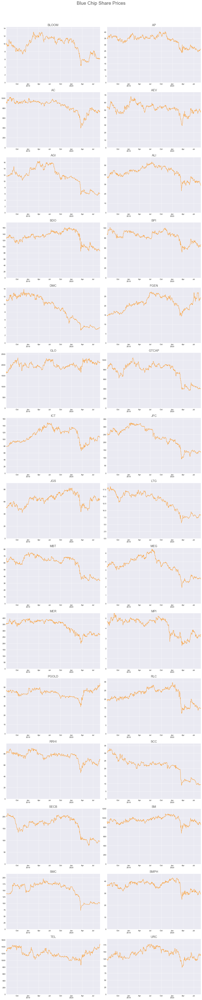

In [7]:
# Plot all in line graph

fig, axes = plt.subplots(15, 2, figsize=global_figsize_all)
counter = 0;

# print(len(axes))
for col in df_pse_shareprice.columns:
    temp_df = df_pse_shareprice[[col]]
    ylim_max = int(temp_df.max())
    # 'Date',
    # 'Share Price',
    generic_plotter(
        temp_df,
        col,
        title_fontsize=16,
        label_fontsize=10,
        figsize=None,
        ax=axes[int(floor(counter / 2)), int(counter % 2)],
        color=global_line_color,
        legend=False,
        alpha=0.75,
        y_lim=[0, ylim_max + (ylim_max * 0.1)]
    )
    counter = counter + 1

fig.suptitle('Blue Chip Share Prices', fontsize=25, color=global_title_color)
fig.tight_layout(rect=global_rect_all)
fig.savefig('output2/shareprices/share_prices_all.png')

#### b. By Sector

##### i. Group by Sector

In [8]:
# Extract by Sectors

dfs_sp_sectors = {}

for sector in df_pse_stocks_info['sector'].cat.categories:
    dfs_sp_sectors[sector] = extract_sector(sector)

# print(dfs_sp_sectors)

##### ii. Plot each sector individually onto a line graph

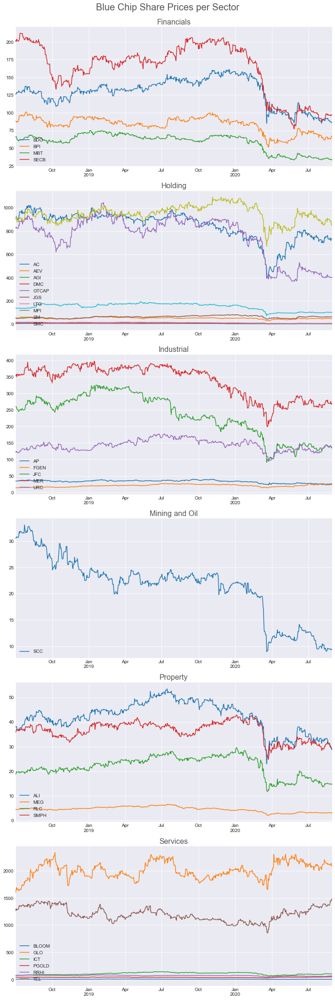

In [9]:
# Plot each sector in separate line graphs

fig, axes = plt.subplots(6, 1, figsize=global_figsize_sectors)
counter = 0;

# print(len(axes))
for key, df in dfs_sp_sectors.items():
    generic_plotter(df, f'{key}',
        label_fontsize=10,
        title_fontsize=16,
        figsize=None,
        ax=axes[counter])
    counter = counter + 1

fig.suptitle('Blue Chip Share Prices per Sector', fontsize=20, color=global_title_color)
fig.tight_layout(rect=global_rect_sectors)
fig.savefig('output2/shareprices/share_prices_per_sector.png')

### IV. Normalize Share Price values from 0 - 100

Normalizing or Scaling the data would allow the calculation of Central Tendency (Mean / Median). Will also normalize Share Price value per Sector.

In [10]:
# Normalize Shareprices
df_pse_shareprice = normalize_df(df_pse_shareprice)

# Normalize to 100 and get average per sector
for key in dfs_sp_sectors.keys():
    dfs_sp_sectors[key] = normalize_df(dfs_sp_sectors[key])

### VI. Visualize Normalized Share Prices

#### a. Individual Share Prices

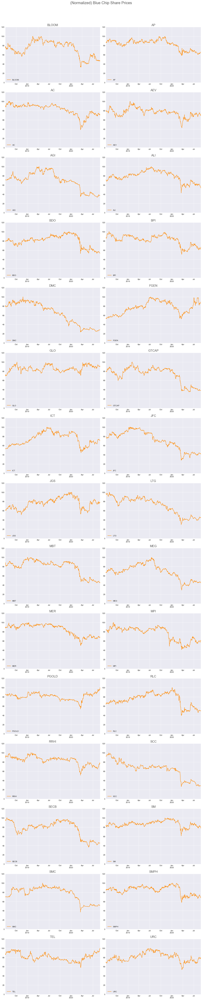

In [11]:
fig, axes = plt.subplots(15, 2, figsize=global_figsize_all)
counter = 0;

# print(len(axes))
for col in df_pse_shareprice.columns:
    generic_plotter(
        df_pse_shareprice[[col]],
        col,
        label_fontsize=10,
        title_fontsize=16,
        figsize=None,
        y_lim=[0,120],
        color=global_line_color,
        ax=axes[int(floor(counter / 2)), int(counter % 2)]
    )
    counter = counter + 1

fig.suptitle('(Normalized) Blue Chip Share Prices', fontsize=20, color=global_title_color)
fig.tight_layout(rect=global_rect_all)
fig.savefig('output2/shareprices/share_prices_all_normalized.png')

#### b. Central Tendency of all Blue Chip Share Prices

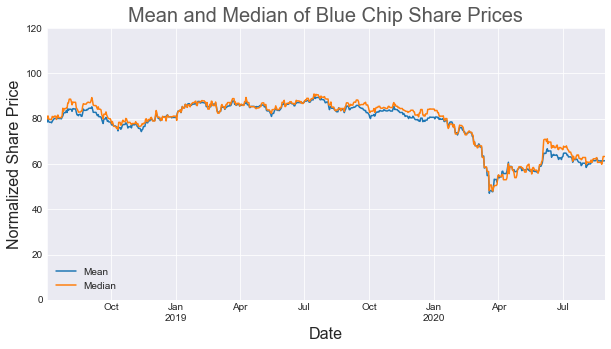

In [12]:
# Plot average of all

df_temp = pd.DataFrame(index=df_pse_shareprice.index)
df_temp['Mean'] = df_pse_shareprice.mean(axis=1)
df_temp['Median'] = df_pse_shareprice.median(axis=1)
ax = generic_plotter(df_temp, 'Mean and Median of Blue Chip Share Prices', 'Date', 'Normalized Share Price', figsize=(10, 5), y_lim=[0,120])
ax.get_figure().savefig('output2/shareprices/mean_median_blue_chip_share_prices.png')

#### c. By Sector

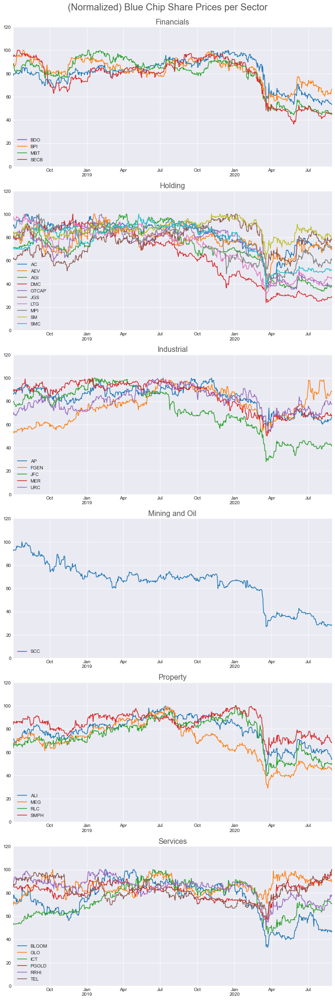

In [13]:
fig, axes = plt.subplots(6, 1, figsize=global_figsize_sectors)
counter = 0;

for key, df in dfs_sp_sectors.items():
    generic_plotter(df, key, title_fontsize=16, label_fontsize=10, y_lim=[0,120], figsize=None, ax=axes[counter])
    counter = counter + 1

fig.suptitle('(Normalized) Blue Chip Share Prices per Sector', fontsize=20, color=global_title_color)
fig.tight_layout(rect=global_rect_sectors)
fig.savefig('output2/shareprices/share_prices_per_sector_normalized.png')
    


#### d. Central Tendencies of each Sector

##### i. Calculate Central Tendency

In [14]:
# define dfs_sp_sectors_avg
dfs_sp_sectors_avg = {}

for key in dfs_sp_sectors.keys():
    df_temp = pd.DataFrame(index=dfs_sp_sectors[key].index)
    df_temp['Mean'] = dfs_sp_sectors[key].mean(axis=1)
    df_temp['Median'] = dfs_sp_sectors[key].median(axis=1)
    dfs_sp_sectors_avg[key] = df_temp
    # dfs_sp_sectors_avg[key] = dfs_sp_sectors[key].mean(axis=1)

##### ii. Plot Figure

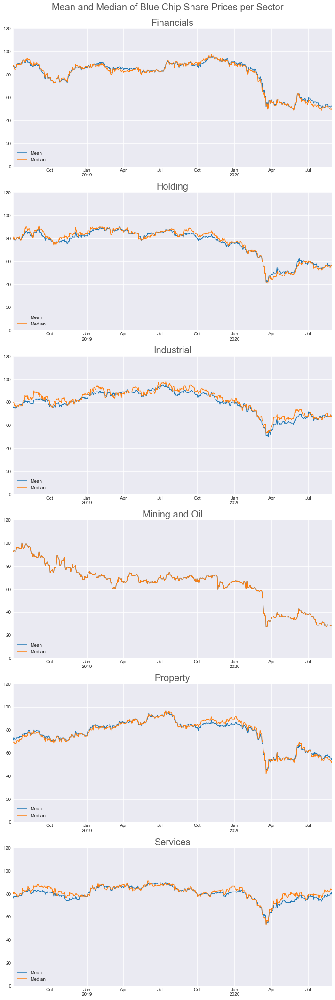

In [15]:
fig, axes = plt.subplots(6, 1, figsize=global_figsize_sectors)
counter = 0;

for key, df in dfs_sp_sectors_avg.items():
    generic_plotter(df, f'{key}', y_lim=[0,120], figsize=None, ax=axes[counter])
    counter = counter + 1

fig.suptitle('Mean and Median of Blue Chip Share Prices per Sector', fontsize=20, color=global_title_color)
fig.tight_layout(rect=global_rect_sectors)
fig.savefig('output2/shareprices/mean_median_blue_chip_share_prices_per_sector.png')



### VII. Analysis

#### PSEi Blue Chips as a Whole

On March 19, 2020, a few days after the NCR and entire Luzon were placed on ECQ, the PSEi, which serves as a barometer of the local stock market, crashed to an 8-year low. The index closed at 4,623.19 points, which translated to a loss of P1.16 trillion. Generally, market share prices of the PSEi were still below the pre-Covid-19 levels. 

Blue chip companies were grouped according to sector to provide a better visualization on how the pandemic influenced market share prices. Prices were normalized to show if trends were similar for each of the companies composing the Financial sector.

#### PSEi Sectors of its Blue Chips

##### i. Financial Sector

Normalized share prices of the companies showed a slight increase from the market crash until the end of June, 2020. However, the movement was generally sideways throughout the second quarter. There was a slight peak in share prices in the middle of April but was not sustained in the succeeding weeks.

Although the Financial sector is considered to be an essential industry that will keep the economy moving, the market seems to take into account the impending defaults brought by the recession. In the earning report of banks in 2Q, they have allocated record highs for non-performing loans. These are loans which are expected by the banks to be uncollectible. 


##### ii. Holding Sector

All of the holding companies experienced a significant dip in share prices following the announcement of the enhanced community quarantine in Metro Manila last March 19. Majority of the subsidiaries of these holding companies are consumer driven - property, retail, or food and beverage. In the succeeding months, they slightly recovered from their March 2020 lows. Some holding companies were able to bounce back to almost 80% of its pre-covid share prices. These are SM, JGS, AC, and AEV. The said holding companies have subsidiaries which are recession-proof or in some cases, benefited from the pandemic. For example, AC owns ACHC which has one of the largest pharma retail chain in the country - Generika. 

##### iii. Industrial Sector

The industrial sector experienced the systemic downturn last March as well. Demand for these companies are generally inelastic. Except for the two outliers, the group’s performance remained sideways. For FGEN, they announced a significant investment from a leading Private Equity Firm, KKR, last June. The partnership was well received by the market thereby registering 52-wk highs. For JFC, they had a steeper decline because in 1Q, they recorded their first ever net loss in the company’s history. They were on a buying spree right before the pandemic and they haven’t realized synergies and returns promised by the acquisitions. This was also compounded by JFC’s announcement of 441 store closures.

##### iv. Mining and Oil

Share price of the mining sector showed a slight recovery from the market crash. Although there was a slight increase towards the middle of June, this was not sustained. The market share price was still significantly below the pre-Covid-19 level. Since Semirara is also a power company, demand for electricity was expected to decline during the pandemic as more companies downsized or closed. 

##### v. Property

All share prices in the property sector also experienced a significant drop during the market crash on March 19, 2020. Although all were able to recover in the succeeding weeks, the movements were generally sideways. Prices were also below the pre-Covid-19 levels. This suggests that buying power of the general population for properties decreased.

##### vi. Services

Similar to other sectors, the companies in the Services sector also experienced a significant drop on March 19, 2020. However, a number were able to recover and showed resilience in market price despite the pandemic. For example, Globe telecom and PLDT market share prices dramatically increased during the Pandemic. This is not unusual since demand for internet and phone services increased during the Pandemic as more people shifted to the online platform for work and online meetings. Meanwhile, Puregold did not only recover during the pandemic but reflected share prices that were higher than the pre-Covid level. This shows that basic commodities and food remained price inelastic as people prioritized spending on basic necessities. Government subsidies during the pandemic were also factors in increasing the share prices of food companies as demand for food products increased.

### VII. Focus on the 1st Half of 2020

This is done in order to magnify the data during the crash.

#### a. Extract 1st Half of 2020

In [16]:
# Extract first 2 quarters of 2020 only
df_pse_shareprice = extract_first_2_quarters(df_pse_shareprice)
for key in dfs_sp_sectors.keys():
    dfs_sp_sectors[key] = extract_first_2_quarters(dfs_sp_sectors[key])

# define dfs_sp_sectors_avg
dfs_sp_sectors_avg = {}

for key in dfs_sp_sectors.keys():
    df_temp = pd.DataFrame(index=dfs_sp_sectors[key].index)
    df_temp['Mean'] = dfs_sp_sectors[key].mean(axis=1)
    df_temp['Median'] = dfs_sp_sectors[key].median(axis=1)
    dfs_sp_sectors_avg[key] = df_temp

#### b. Plot Magnified Data

##### i. Individual Share Prices

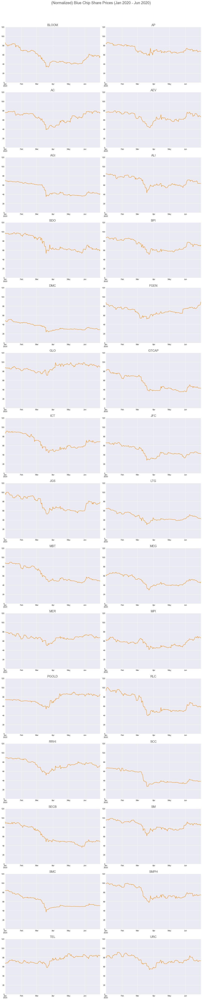

In [17]:
# replot line graph

fig, axes = plt.subplots(15, 2, figsize=global_figsize_all)
counter = 0;

# print(len(axes))
for col in df_pse_shareprice.columns:
    generic_plotter(
        df_pse_shareprice[[col]],
        col,
        label_fontsize=10,
        title_fontsize=16,
        figsize=None,
        y_lim=[0,120],
        legend=False,
        color=global_line_color,
        ax=axes[int(floor(counter / 2)), int(counter % 2)]
    )
    counter = counter + 1

fig.suptitle('(Normalized) Blue Chip Share Prices (Jan 2020 - Jun 2020)', fontsize=20, color=global_title_color)
fig.tight_layout(rect=global_rect_all)
fig.savefig('output2/shareprices/share_prices_all_2_qs.png')


##### ii. Individual Share Prices' Central Tendency

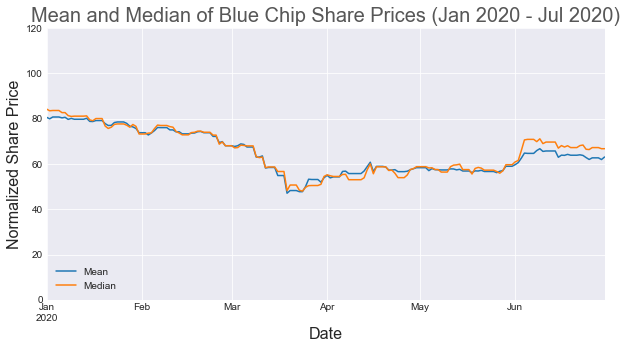

In [18]:
# replot line graph avg
# df_temp = df_pse_shareprice.mean(axis=1)

df_temp = pd.DataFrame(index=df_pse_shareprice.index)
df_temp['Mean'] = df_pse_shareprice.mean(axis=1)
df_temp['Median'] = df_pse_shareprice.median(axis=1)

generic_plotter(df_temp, 'Mean and Median of Blue Chip Share Prices (Jan 2020 - Jul 2020)', 'Date', 'Normalized Share Price', figsize=(10,5), y_lim=[0,120])
ax.get_figure().savefig('output2/shareprices/mean_median_blue_chip_share_prices_2_qs.png')

##### iii. Each Sector

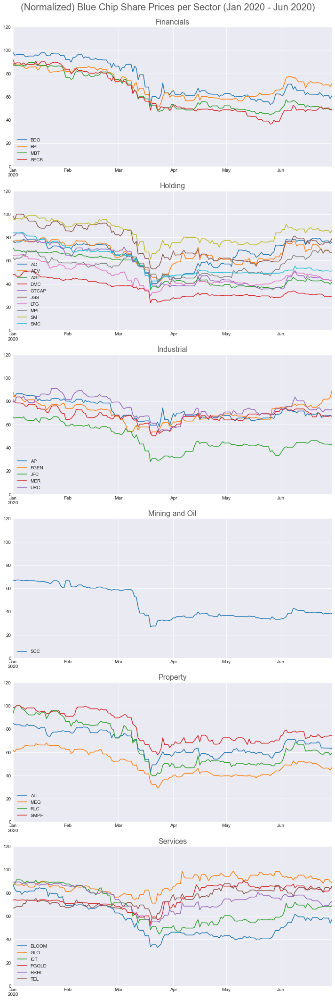

In [19]:
# Replot all sectors

fig, axes = plt.subplots(6, 1, figsize=global_figsize_sectors)
counter = 0;

for key, df in dfs_sp_sectors.items():
    generic_plotter(
    df,
    key,
    y_lim=[0,120],
    title_fontsize=16,
    label_fontsize=10,
    figsize=None,
    ax=axes[counter])
    
    counter = counter + 1

fig.suptitle('(Normalized) Blue Chip Share Prices per Sector (Jan 2020 - Jun 2020)', fontsize=20, color=global_title_color)
fig.tight_layout(rect=global_rect_sectors)
fig.savefig('output2/shareprices/share_prices_per_sector_normalized_2_qs.png')



##### iv. Central Tendency of Each Sector

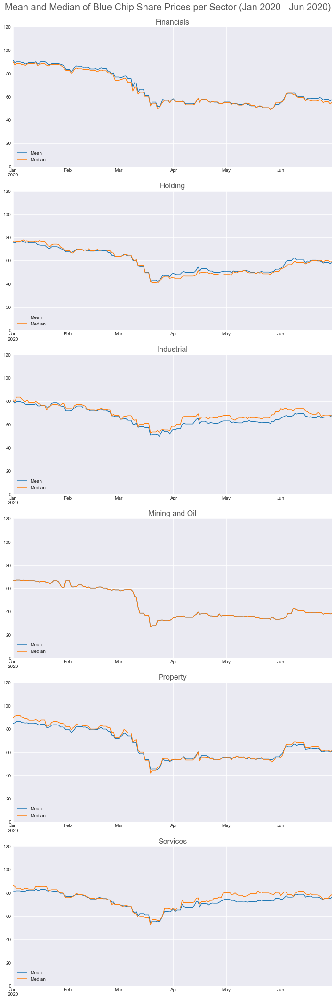

In [20]:
fig, axes = plt.subplots(6, 1, figsize=global_figsize_sectors)
counter = 0;

for key, df in dfs_sp_sectors_avg.items():
    generic_plotter(
    df,
    key,
    y_lim=[0,120],
    title_fontsize=16,
    label_fontsize=10,
    figsize=None,
    ax=axes[counter])
    
    counter = counter + 1

fig.suptitle('Mean and Median of Blue Chip Share Prices per Sector (Jan 2020 - Jun 2020)', fontsize=20, color=global_title_color)
fig.tight_layout(rect=global_rect_sectors)
fig.savefig('output2/shareprices/mean_median_blue_chip_share_prices_per_sector_2_qs.png')


## C. Regional Map

### I. Read and Wrangle Data

#### a. Extract Covid-19 Data

In [21]:
# Get Covid Data
df_covid = pd.read_csv('datasets/covid_spread_from_daily_summary.csv')
cols_to_remove = ['confirmed_new', 'confirmed_total', 'deaths_new', 'deaths_total', 'active_total', 'recov._total', 'tested_total']
df_covid.drop(cols_to_remove, axis=1, inplace=True)

df_covid['date'] = pd.to_datetime(df_covid['date'])
df_covid['month'] = df_covid['date'].dt.month
df_covid = df_covid[df_covid['month'].isin([1,2,3,4,5,6])]
print(df_covid.month.unique())

[1 2 3 4 5 6]


#### b. Extract Maximum Covid-19 Value

For plotting purposes - will be used to set the max value portrayed in the plot.

In [22]:
df = df_covid.sum().reset_index()
df = df.rename(columns={'index': 'region', 0: 'count'})
df
vmax = df['count'].max()
# vmax = 10000
print(f"VMAX: {vmax}")

VMAX: 18684


#### c. Extract Gross Regional Domestic Product (GRDP)

In [23]:
# Get GRDP Data
df_grdp = pd.read_csv('datasets/grdp-2018-clean.csv')
df_grdp['REGIONS'] = df_grdp['REGIONS'].str.lower()
df_grdp.head(3)

,REGIONS,GDP
0,ncr,6534797
1,region 1,547522
2,region 2,303001


##### i. Clean Regions and Provinces Data.

In [24]:
# Extract regional data
df_regions = pd.read_csv('datasets/regions_provinces_data.csv')
df_regions['REGIONS'] = df_regions['REGIONS'].str.lower()
df_regions['PROVINCES'] = df_regions['PROVINCES'].str.lower()
df_regions['REGIONS'].unique()
# print(df_regions['PROVINCES'].unique())

array(['region 1', 'region 2', 'region 3', 'region 4a', 'region 4b',
       'region 5', 'region 6', 'region 7', 'region 8', 'region 9',
       'region 10', 'region 11', 'region 12', 'region 13', 'region 14',
       'region 15', 'ncr'], dtype=object)

#### d. Extract Shapefile for Heatmap

In [25]:
# Read shapefile
ph = gpd.read_file('datasets/gadm36_PHL_shp/gadm36_PHL_1.shp')
ph['NAME_1'] = ph['NAME_1'].str.lower()
print(ph['NAME_1'].unique())
print(len(ph['NAME_1'].unique()))

['abra' 'agusan del norte' 'agusan del sur' 'aklan' 'albay' 'antique'
 'apayao' 'aurora' 'basilan' 'bataan' 'batanes' 'batangas' 'benguet'
 'biliran' 'bohol' 'bukidnon' 'bulacan' 'cagayan' 'camarines norte'
 'camarines sur' 'camiguin' 'capiz' 'catanduanes' 'cavite' 'cebu'
 'compostela valley' 'davao del norte' 'davao del sur' 'davao oriental'
 'dinagat islands' 'eastern samar' 'guimaras' 'ifugao' 'ilocos norte'
 'ilocos sur' 'iloilo' 'isabela' 'kalinga' 'la union' 'laguna'
 'lanao del norte' 'lanao del sur' 'leyte' 'maguindanao' 'marinduque'
 'masbate' 'metropolitan manila' 'misamis occidental' 'misamis oriental'
 'mountain province' 'negros occidental' 'negros oriental'
 'north cotabato' 'northern samar' 'nueva ecija' 'nueva vizcaya'
 'occidental mindoro' 'oriental mindoro' 'palawan' 'pampanga' 'pangasinan'
 'quezon' 'quirino' 'rizal' 'romblon' 'samar' 'sarangani' 'siquijor'
 'sorsogon' 'south cotabato' 'southern leyte' 'sultan kudarat' 'sulu'
 'surigao del norte' 'surigao del sur' 't

##### i. Merge with Regions Data

This will add the **REGIONS** feature to the loaded shapefile.

In [26]:
# Add Regions data
ph = ph.merge(df_regions, left_on='NAME_1', right_on='PROVINCES', how='left')

##### ii. Merge GRDP Data

In [27]:
# Add GRDP data
ph = ph.merge(df_grdp, on='REGIONS', how='left')

##### iii. Rename Covid-19 Data for Merging Purposes

In [28]:
# Rename region columns in df_covid
column_dict = {
    'regions_ncr': 'ncr',
    'regions_i': 'region 1',
    'regions_ii': 'region 2',
    'regions_iii': 'region 3',
    'regions_iv_a': 'region 4a',
    'regions_iv_b': 'region 4b',
    'regions_v': 'region 5',
    'regions_vi': 'region 6',
    'regions_vii': 'region 7',
    'regions_viii': 'region 8',
    'regions_ix': 'region 9',
    'regions_x': 'region 10',
    'regions_xi': 'region 11',
    'regions_xii': 'region 12',
    'regions_xiii': 'region 13',
    'regions_car': 'region 14',
    'regions_bar': 'region 15'
}
df_covid.rename(columns=column_dict, inplace=True)

### II. Define Heatmap Utility Functions

In [29]:
# Define extract_hm_for_month
def extract_hm_for_month(months, should_log=False):
    df = df_covid[df_covid['month'].isin(months)]
    df = df.sum().reset_index().rename(columns={'index': 'region', 0: 'count'})
    if should_log:
        df['count'] = [np.log(x) if x != 0 else x for x in df['count']]
    # print(ph.merge(df, left_on='REGIONS', right_on='region', how='left'))
    # print(ph['REGIONS'].unique())
    return ph.merge(df, left_on='REGIONS', right_on='region', how='left')

In [30]:
# Define plotter
def plot_hm_for_month(months, title, should_log=False):
    # vmax=vmax, 
    if should_log:
        vmax_local = 10
    else:
        vmax_local = vmax
    ax = extract_hm_for_month(months, should_log).plot(column="count", figsize=(6,12), cmap=plt.cm.Reds, vmax=vmax_local, vmin=0, legend=True, edgecolor='lightgrey', legend_kwds={'shrink': 0.7})
    ax.set_title(title, fontsize=20)
    ax.get_figure().savefig(f'output2/heatmap/{title}.png')

### III. Covid-19 Monthly Reported Cases

#### a. Visualizaiton

##### i. Heatmap

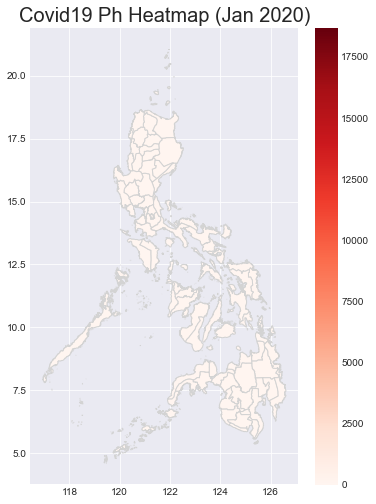

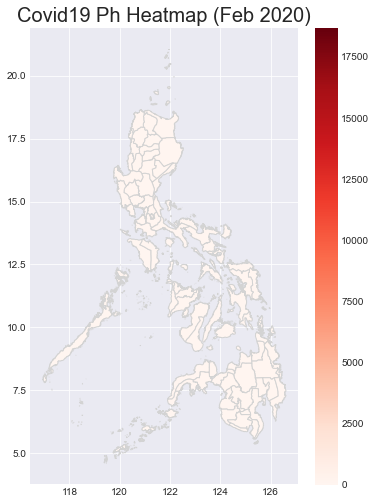

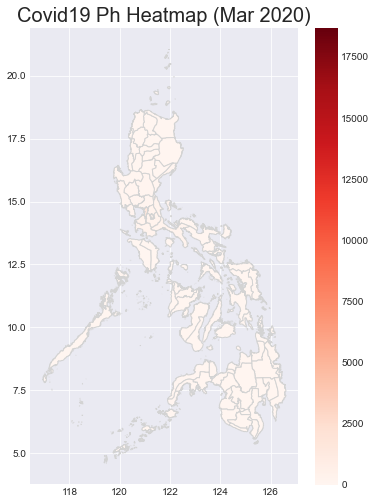

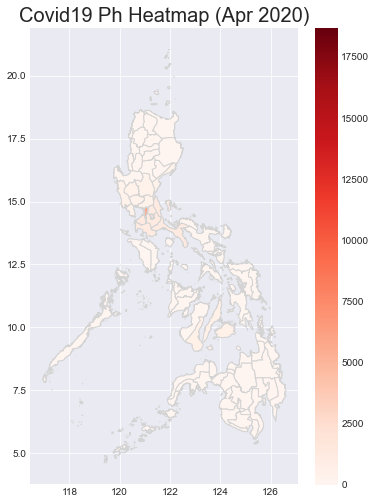

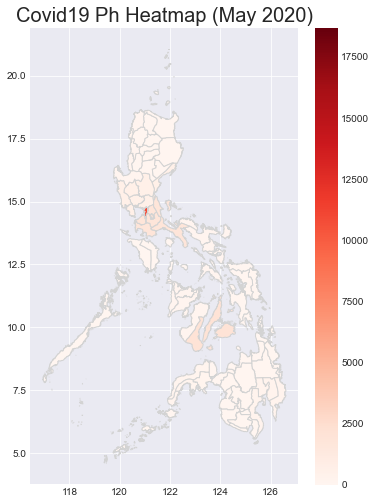

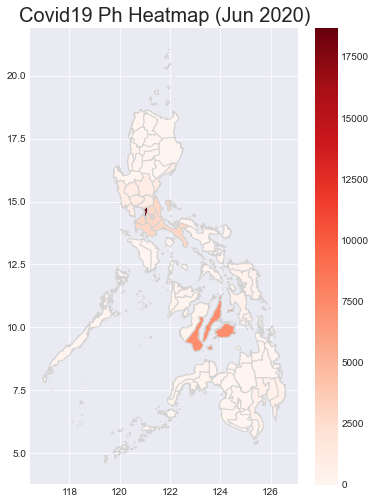

In [31]:
plot_hm_for_month([1], 'Covid19 Ph Heatmap (Jan 2020)')
plot_hm_for_month([1,2], 'Covid19 Ph Heatmap (Feb 2020)')
plot_hm_for_month([1,2,3], 'Covid19 Ph Heatmap (Mar 2020)')
plot_hm_for_month([1,2,3,4], 'Covid19 Ph Heatmap (Apr 2020)')
plot_hm_for_month([1,2,3,4,5], 'Covid19 Ph Heatmap (May 2020)')
plot_hm_for_month([1,2,3,4,5,6], 'Covid19 Ph Heatmap (Jun 2020)')

##### ii. Heatmap (Logarithmic Transformation)

To better represent regions that are too far off from the maximum value (i.e., **NCR**).

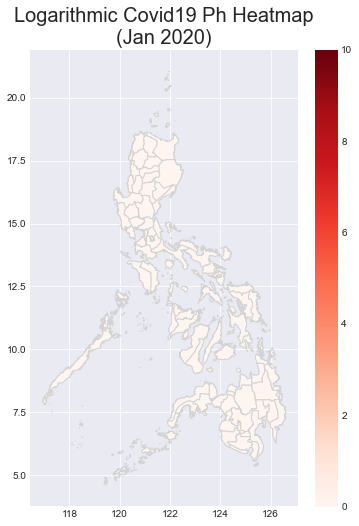

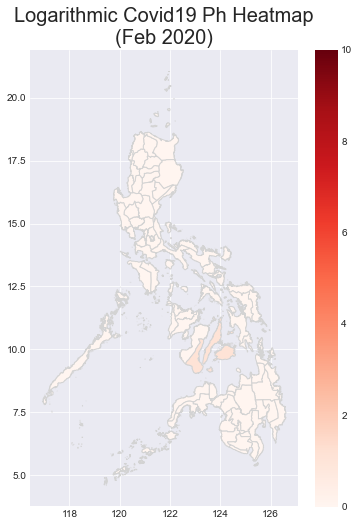

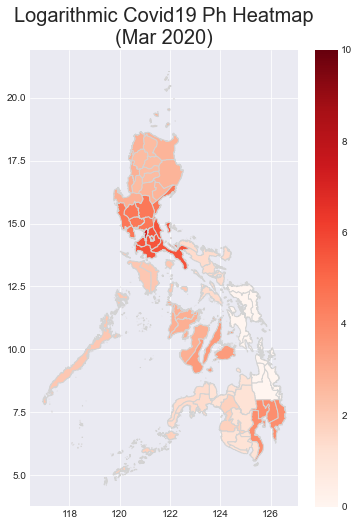

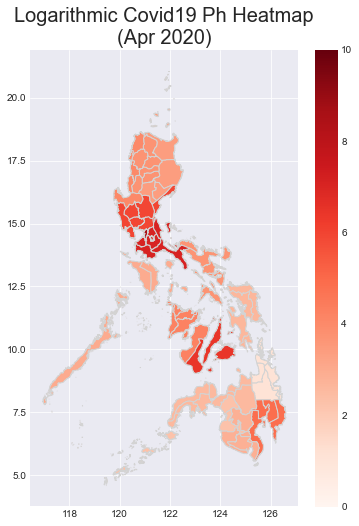

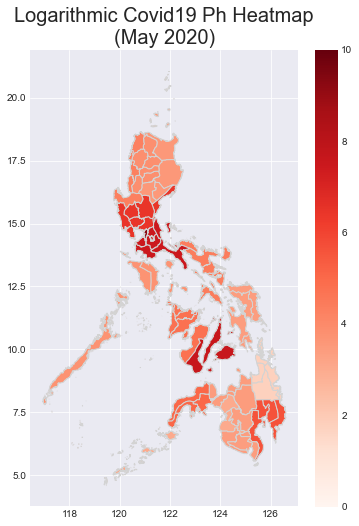

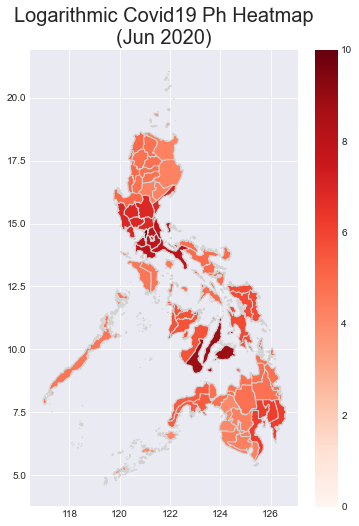

In [32]:
plot_hm_for_month([1], 'Logarithmic Covid19 Ph Heatmap\n(Jan 2020)', True)
plot_hm_for_month([1,2], 'Logarithmic Covid19 Ph Heatmap\n(Feb 2020)', True)
plot_hm_for_month([1,2,3], 'Logarithmic Covid19 Ph Heatmap\n(Mar 2020)', True)
plot_hm_for_month([1,2,3,4], 'Logarithmic Covid19 Ph Heatmap\n(Apr 2020)', True)
plot_hm_for_month([1,2,3,4,5], 'Logarithmic Covid19 Ph Heatmap\n(May 2020)', True)
plot_hm_for_month([1,2,3,4,5,6], 'Logarithmic Covid19 Ph Heatmap\n(Jun 2020)', True)

##### iii. Bar Graph

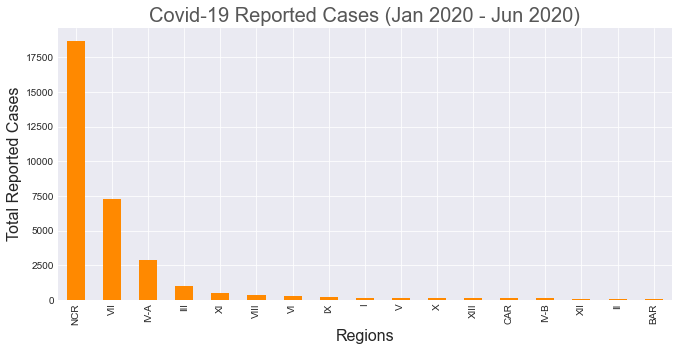

In [33]:
df_temp = df_covid[df_covid['month'].isin([1,2,3,4,5,6])]
df_temp.drop('month', axis=1, inplace=True)
column_dict = {
    'ncr': 'NCR',
    'region 1': 'I',
    'region 2': 'II',
    'region 3': 'III',
    'region 4a': 'IV-A',
    'region 4b': 'IV-B',
    'region 5': 'V',
    'region 6': 'VI',
    'region 7': 'VII',
    'region 8': 'VIII',
    'region 9': 'IX',
    'region 10': 'X',
    'region 11': 'XI',
    'region 12': 'XII',
    'region 13': 'XIII',
    'region 14': 'CAR',
    'region 15': 'BAR'
}
df_temp.rename(columns=column_dict, inplace=True)
df_temp = df_temp.sum().reset_index().rename(columns={'index': 'region', 0: 'count'})
df_temp.sort_values('count', ascending=False, inplace=True)

ax = bar_plotter(
    range(len(df_temp)),
    df_temp['region'].unique(),
    "Covid-19 Reported Cases (Jan 2020 - Jun 2020)",
    20,
    (11,5),
    '#575757',
    16,
    "Regions",
    "Total Reported Cases")

ax.get_figure().savefig('output2/bar/bar_first_2_qs.png')


### IV. GRDP

#### a. Heatmap

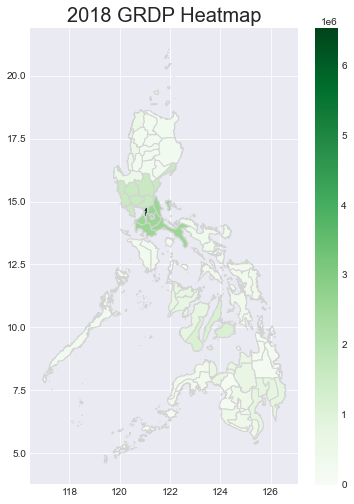

In [34]:
ax = ph.plot(column="GDP", figsize=(6,12), cmap=plt.cm.Greens, vmin=0, edgecolor='lightgrey', legend=True, legend_kwds={'shrink': 0.7})
ax.set_title('2018 GRDP Heatmap', fontsize=20)
ax.get_figure().savefig(f'output2/heatmap/2018 GRDP Heatmap.png')

#### b. Heatmap (Logarithmic Transformation)

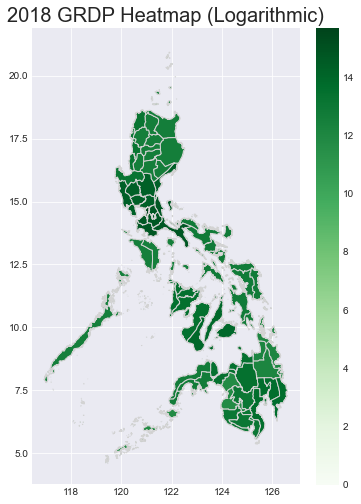

In [35]:
ph2 = ph.copy()
ph2['GDP'] = [np.log(x) if x != 0 else x for x in ph['GDP']]

ax = ph2.plot(column="GDP", figsize=(6,12), cmap=plt.cm.Greens, vmin=0, edgecolor='lightgrey', legend=True, legend_kwds={'shrink': 0.7})
ax.set_title('2018 GRDP Heatmap (Logarithmic)', fontsize=20)
ax.get_figure().savefig(f'output2/heatmap/2018 GRDP Heatmap (Logarithmic).png')

ph2 = pd.DataFrame()
del ph2

#### c. Bar Graph

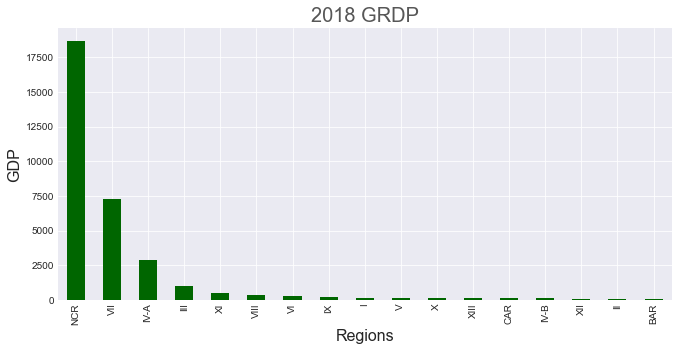

In [36]:
df_grdp2 = df_grdp.copy()
column_dict = {
    'ncr': 'NCR',
    'region 1': 'I',
    'region 2': 'II',
    'region 3': 'III',
    'region 4a': 'IV-A',
    'region 4b': 'IV-B',
    'region 5': 'V',
    'region 6': 'VI',
    'region 7': 'VII',
    'region 8': 'VIII',
    'region 9': 'IX',
    'region 10': 'X',
    'region 11': 'XI',
    'region 12': 'XII',
    'region 13': 'XIII',
    'region 14': 'CAR',
    'region 15': 'BAR'
}
df_grdp2['REGIONS'] = df_grdp2['REGIONS'].replace(column_dict.keys(), column_dict.values())
df_grdp2.sort_values('GDP', ascending=False, inplace=True)

ax = bar_plotter(
    range(len(df_temp)),
    df_temp['region'].unique(),
    "2018 GRDP",
    20,
    (11,5),
    '#575757',
    16,
    "Regions",
    "GDP",
    plot_color='#006600')

ax.get_figure().savefig('output2/bar/bar_grdp.png')

### V. Monthly Covid-19 Reported Cases and GRDP Analysis

Despite having one of the longest and most restrictive lockdowns in the world, Covid 19 cases rapidly increased in the most urbanized and populous regions in the country. By the end of the second quarter, the country had 36,438 confirmed cases and 1,255 deaths. This further increased to 258,000 in the first week of September with 4,292 deaths.

Interestingly, the cases were concentrated on the top 5 most affluent regions based on GDP per capita. This may not be unusual since these regions are also the most densely populated and are centers of economic activities and development. It is suggested that the spread of Covid-19 is increased in populous areas and highly urbanized centers.

A comparison of the daily reported cases in the five regions showed that daily cases increased in frequency from the first confirmed local transmission in the NCR to the end of the second quarter. Covid cases represented in the maps were transformed to logarithmic scales for better visualization of the data.

Foreign visitors from China who tested positive for Covid-19 were the first reported cases in the Philippines. These cases were recorded in the NCR and Region 7 only.

Cumulative number of cases in the Philippines rapidly increased from the first recorded local transmission in March, 2020 to April, 2020. Despite the strict lockdowns imposed in the various seaports and airports in the country, locally stranded individuals were allowed to travel to their home cities or provinces. It is suggested that movement of people from areas with high cases of Covid-19, such as the NCR, to other provinces could have contributed to the community transmission in areas that had previously zero Covid-19 cases.

The continuous increase in daily reported cases of Covid-19 in the entire second quarter demonstrated that the curve of the current Covid-19 pandemic has not yet flattened in the Philippines. As shown in the map, cases continued to increase in the most populous regions. By the end of June, 2020, all regions had reported cases of Covid-19. However, regions that were less populous continued to have very low Covid-19 reported cases.

## D. Daily Reported Covid 19 Cases of Top 5 Regions by GRDP

### I. Read and Wrangle Covid-19 Daily Reported cases

In [37]:
# Read in data
df_daily_cases2 = pd.read_csv('datasets/covid_spread_from_daily_summary.csv')

# Perform Data Wrangling
df_daily_cases = df_daily_cases2[['date', 'regions_iii', 'regions_ncr', 'regions_iv_a', 'regions_xi', 'regions_vii']].copy()
df_daily_cases.rename(columns={
    'regions_iii': 'Region III',
    'regions_ncr': 'NCR',
    'regions_iv_a': 'Region IV-A',
    'regions_xi': 'Region XI',
    'regions_vii': 'Region VII'
}, inplace=True)
df_daily_cases['date'] = pd.to_datetime(df_daily_cases['date'])
idx = pd.date_range('01-01-2020', '06-30-2020')
df_daily_cases.set_index(['date'], inplace=True)
# data.index = pd.DatetimeIndex(data['date'])
df_daily_cases = df_daily_cases.reindex(idx, fill_value=0)
df_daily_cases.fillna(0, inplace=True)

### II. Plot Covid-19 Daily Reported Cases of Top 5 Regions by GRDP

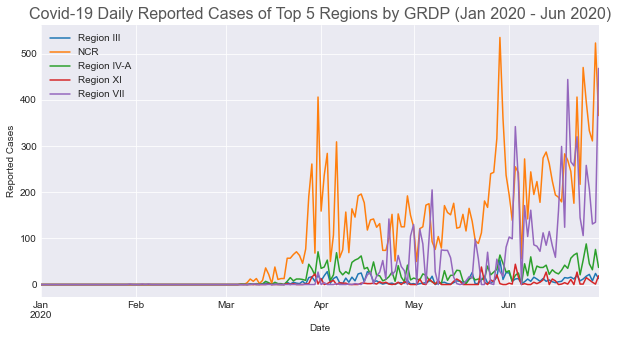

In [38]:
# print(df_daily_cases)
ax = generic_plotter(
    df_daily_cases,
    'Covid-19 Daily Reported Cases of Top 5 Regions by GRDP (Jan 2020 - Jun 2020)',
    'Date',
    'Reported Cases',
    title_fontsize=16,
    label_fontsize=10,
    figsize=(10, 5),
    legend_loc='upper left'
)
ax.get_figure().savefig('output2/covid19/covid_each_region.png')

### III. Plot Covid-19 Daily Reported Cases of the Whole Philippines and of the Sum of Top 5 Regions by GRDP

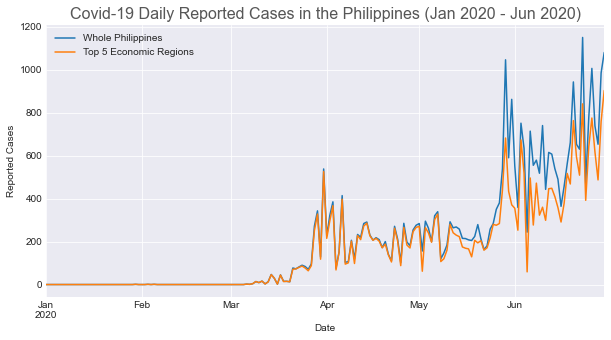

In [39]:
# Map top 5 and whole ph
df_daily_cases2 = df_daily_cases2[['date', 'confirmed_new']].copy()
df_daily_cases2['date'] = pd.to_datetime(df_daily_cases2['date'])
# print(df_daily_cases2)
idx = pd.date_range('01-01-2020', '06-30-2020')
df_daily_cases2.set_index(['date'], inplace=True)
# print(df_daily_cases2)
df_daily_cases2 = df_daily_cases2.reindex(idx, fill_value=0)
df_daily_cases2.fillna(0, inplace=True)
df_daily_cases2.rename(columns={'confirmed_new': 'Whole Philippines'}, inplace=True)
df_daily_cases2['Top 5 Economic Regions'] = df_daily_cases.sum(axis=1)

ax = generic_plotter(
    df_daily_cases2,
    'Covid-19 Daily Reported Cases in the Philippines (Jan 2020 - Jun 2020)',
    'Date',
    'Reported Cases',
    title_fontsize=16,
    label_fontsize=10,
    figsize=(10,5),
    legend_loc='upper left'
)
ax.get_figure().savefig('output2/covid19/whole_ph.png')

### IV. Normalize Daily Reported Cases' values from 0 - 100

This will allow us to plot the Cases with the Share Prices while keeping its trend.

In [40]:
# Normalize Daily Cases

df_daily_cases = normalize_df(df_daily_cases2[['Top 5 Economic Regions']].copy())


### V. Visualize Normalized Data

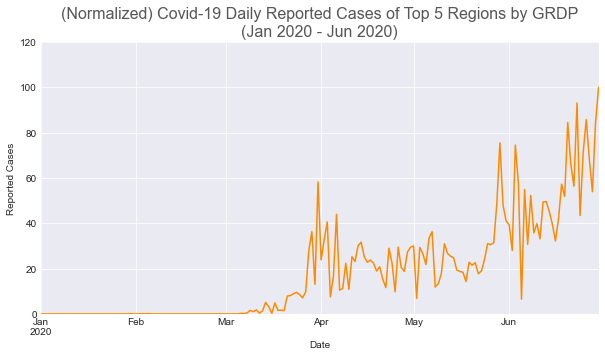

In [41]:
# Plot normalized sum of top 5 econ regions
ax= generic_plotter(
    df_daily_cases,
    '(Normalized) Covid-19 Daily Reported Cases of Top 5 Regions by GRDP\n(Jan 2020 - Jun 2020)',
    'Date',
    'Reported Cases',
    title_fontsize=16,
    label_fontsize=10,
    figsize=(10,5),
    y_lim=[0,120],
    legend_loc='upper left',
    legend=False,
    color=global_line_color
)

ax.get_figure().savefig('output2/covid19/covid_top_regions_normalized.png')

### VI. Analysis

The first index case of the novel coronavirus (Covid-19) was recorded on December 8, 2019, in Wuhan, China. Initially thought to share the same characteristics as the severe acute respiratory syndrome (SARS) coronavirus, the strain causing Covid-19 was more infectious and virulent and rapidly progressed into a pandemic. Since then, it has severely disrupted social and economic activities in the World. Currently, the World Health Organization reports that there are more than 28 million confirmed Covid-19 cases across the world with 906,092 deaths.

In the Philippines, the first case was reported by the Department of Health on January 30, 2020. A 38-year-old female Chinese national tested positive for Covid-19. Almost two months later, on March 7, 2020, the first local transmission of Covid-19 in the National Capital Region (NCR) was confirmed. Initially resisting calls to impose travel bans and restrictions, the Philippine government only imposed strict travel restriction and a community quarantine on March 12, 2020. In contrast, other Southeast Asian countries, such as Vietnam, have imposed strict lockdowns as early as January. The travel ban and enhanced community quarantine (ECQ) took effect on March 15, 2020. The rest of the country then imposed their own iterations of the community quarantine and restricted travel by air and sea.  


## D. Relationship between Market Share Prices and Covid-19 Cases

### I. Visualization

#### a. Individual Share Prices and the Daily Reported Covid-19 Cases of the first half of 2020 (Line Graph)

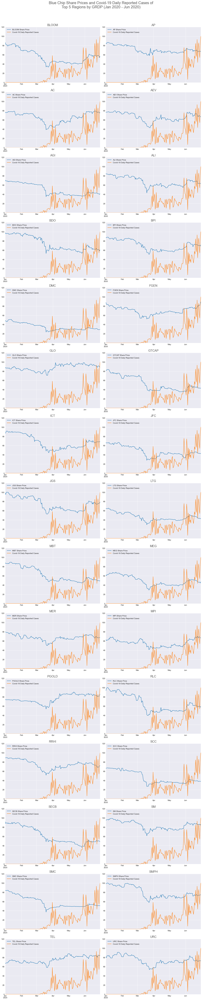

In [42]:
# Plot shareprices and sum of top 5 econ regions daily report 

fig, axes = plt.subplots(15, 2, figsize=global_figsize_all)
counter = 0;

# print(len(axes))
for col in df_pse_shareprice.columns:
    df = generate_covid_shareprice_data(df_pse_shareprice, col, df_daily_cases)
    col_dict = {}
    col_dict[col] = f'{col} Share Price'
    df.rename(columns=col_dict, inplace=True)
    
    generic_plotter(
    df,
    col,
    y_lim=[0,120],
    label_fontsize=10,
    title_fontsize=16,
    figsize=None,
    ax=axes[int(floor(counter / 2)), int(counter % 2)],
    legend_loc='upper left')
    
    counter = counter + 1

fig.suptitle('Blue Chip Share Prices and Covid-19 Daily Reported Cases of\nTop 5 Regions by GRDP (Jan 2020 - Jun 2020)', fontsize=20, color=global_title_color)
fig.tight_layout(rect=global_rect_all)
fig.savefig('output2/covid19/share_prices_all_with_covid.png')


#### b. Individual Sector Share Prices' Central Tendencies and the Daily Reported Covid-19 Cases of the first half of 2020 (Line Graph)

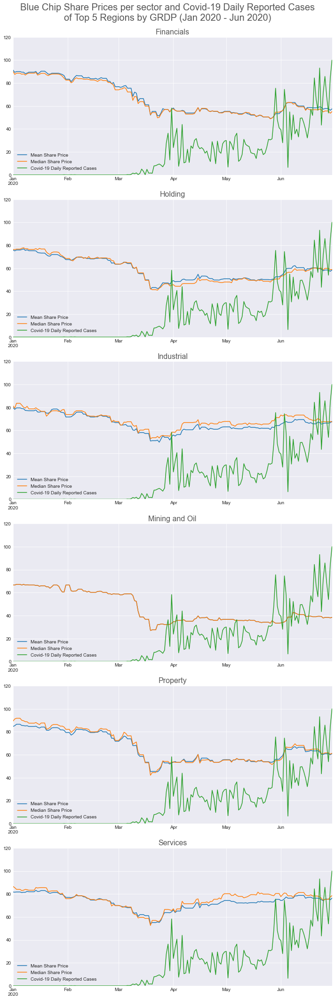

In [43]:
fig, axes = plt.subplots(6, 1, figsize=global_figsize_sectors)
counter = 0;

for key, df_temp in dfs_sp_sectors_avg.items():
    df_temp = df_temp.copy()
    df_temp['Covid-19 Daily Reported Cases'] = df_daily_cases
    df_temp.rename(columns={'Mean': 'Mean Share Price', 'Median': 'Median Share Price'}, inplace=True)
    generic_plotter(
        df_temp,
        key,
        title_fontsize=16,
        label_fontsize=10,
        y_lim=[0,120],
        figsize=None,
        ax=axes[counter]
    )
    counter = counter + 1

fig.suptitle('Blue Chip Share Prices per sector and Covid-19 Daily Reported Cases\nof Top 5 Regions by GRDP (Jan 2020 - Jun 2020)', fontsize=20, color=global_title_color)
fig.tight_layout(rect=global_rect_sectors2)
fig.savefig('output2/covid19/share_prices_per_sector_with_covid.png')

    

#### c. Share Prices' Central Tendencies and the Daily Reported Covid-19 Cases of the first half of 2020 (Line Graph)

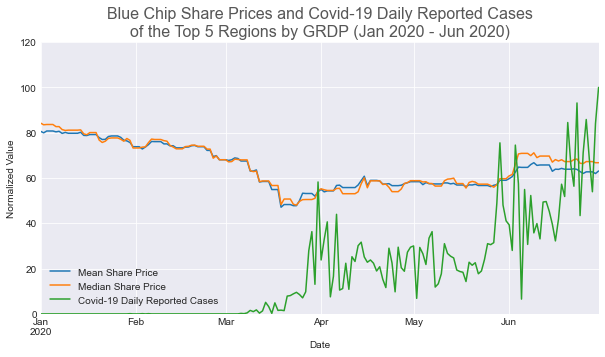

In [44]:
# PH as a whole
df_temp = pd.DataFrame(index=df_pse_shareprice.index)
df_temp['Mean Share Price'] = df_pse_shareprice.mean(axis=1)
df_temp['Median Share Price'] = df_pse_shareprice.median(axis=1)
df_temp['Covid-19 Daily Reported Cases'] = df_daily_cases
ax=generic_plotter(
    df_temp,
    'Blue Chip Share Prices and Covid-19 Daily Reported Cases\nof the Top 5 Regions by GRDP (Jan 2020 - Jun 2020)',
    'Date',
    'Normalized Value',
    figsize=(10, 5),
    title_fontsize=16,
    label_fontsize=10,
    y_lim=[0,120]
)
ax.get_figure().savefig('output2/covid19/mean_median_share_prices_with_covid.png')


#### d. Individual Share Prices and the Daily Reported Covid-19 Cases of the first half of 2020 (Scatterplot)

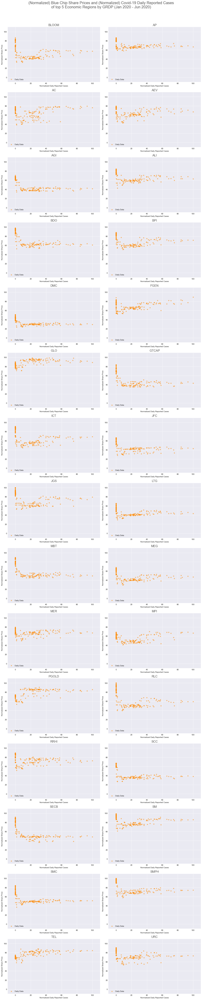

In [45]:
fig, axes = plt.subplots(15, 2, figsize=global_figsize_all)
counter = 0;

# print(len(axes))
for col in df_pse_shareprice.columns:
    df = generate_covid_shareprice_data(df_pse_shareprice, col, df_daily_cases)
    
    generic_plotter(df,
    col,
    'Normalized Daily Reported Cases',
    'Normalized Share Price',
    x_lim=(-10,110),
    y_lim=[-10,110],
    label_fontsize=10,
    title_fontsize=16,
    kind='scatter',
    x='Covid-19 Daily Reported Cases',
    y=col,
    figsize=None,
    ax=axes[int(floor(counter / 2)), int(counter % 2)],
    alpha = 0.5,
    color=global_line_color,
    label='Daily Data')
    
    counter = counter + 1

fig.suptitle('(Normalized) Blue Chip Share Prices and (Normalized) Covid-19 Daily Reported Cases\nof top 5 Economic Regions by GRDP (Jan 2020 - Jun 2020)', fontsize=20, color=global_title_color)
fig.tight_layout(rect=global_rect_all)
fig.savefig('output2/covid19/scatter_share_price_all_with_covid.png')


#### e. The correlation coefficient of the Individual Share Prices and the Daily Reported Covid-19 Cases of the first half of 2020 (Horizontal Bar Graph)

  Blue Chip Stocks  Correlation Coefficient
0            BLOOM                -0.364618
1               AP                -0.390053
2               AC                 0.117435
3              AEV                -0.091816
4              AGI                -0.647156


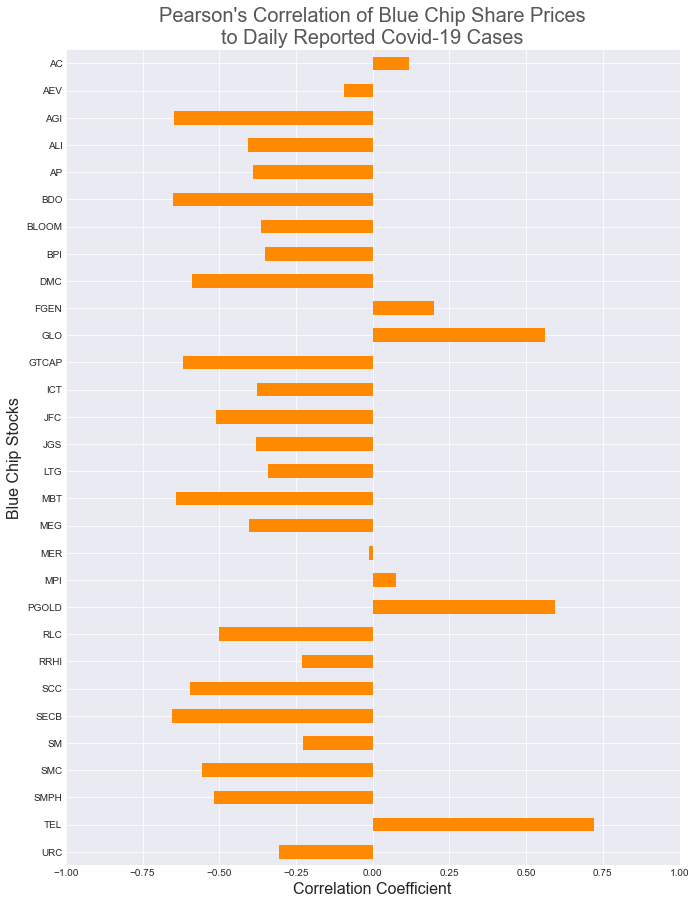

In [46]:
df_dict = {'Blue Chip Stocks': [], 'Correlation Coefficient': []}
for col in df_pse_shareprice.columns:
    df_temp = generate_covid_shareprice_data(df_pse_shareprice, col, df_daily_cases).copy()
    df_dict['Blue Chip Stocks'].append(col)
    df_dict['Correlation Coefficient'].append(df_temp[col].corr(df_temp['Covid-19 Daily Reported Cases'], method='pearson'))
df_temp = pd.DataFrame(data=df_dict)
print(df_temp.head(5))
df_temp.sort_values('Blue Chip Stocks', ascending=False, inplace=True)
# df_temp.plot(kind='barh')

ax = corrcoeff_plotter(
    range(len(df_temp)),
    df_temp['Blue Chip Stocks'].unique(),
    "Pearson's Correlation of Blue Chip Share Prices\nto Daily Reported Covid-19 Cases",
    20,
    (11,15),
    '#575757',
    16,
    "Correlation Coefficient",
    "Blue Chip Stocks")

ax.get_figure().savefig('output2/covid19/corrcoeff-indiv.png')



#### f. Individual Sector Share Prices' Average and the Daily Reported Covid-19 Cases of the first half of 2020 (Scatterplot)

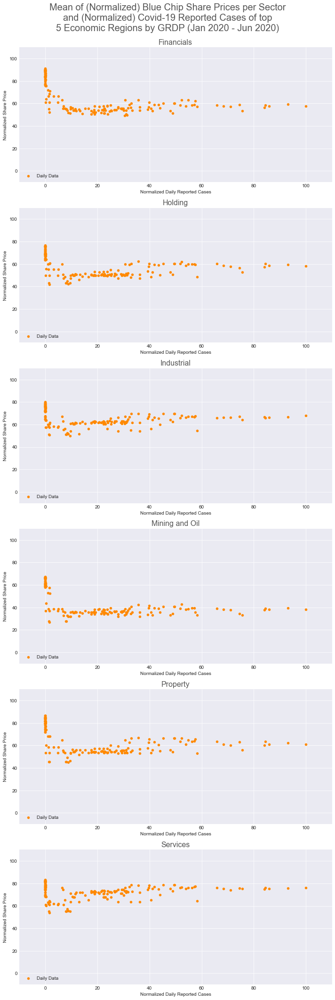

In [47]:
fig, axes = plt.subplots(6, 1, figsize=global_figsize_sectors)
counter = 0;

# print(len(axes))
for key, df in dfs_sp_sectors_avg.items():
    df_temp = df.copy()
    df_temp['Covid-19 Daily Reported Cases'] = df_daily_cases
    
    generic_plotter(df_temp,
    key,
    'Normalized Daily Reported Cases',
    'Normalized Share Price',
    x_lim=(-10,110),
    y_lim=[-10,110],
    label_fontsize=10,
    title_fontsize=16,
    kind='scatter',
    x='Covid-19 Daily Reported Cases',
    y='Mean',
    label='Daily Data',
    figsize=None,
    ax=axes[counter],
    color=global_line_color)
    
    counter = counter + 1

fig.suptitle('Mean of (Normalized) Blue Chip Share Prices per Sector\nand (Normalized) Covid-19 Reported Cases of top\n5 Economic Regions by GRDP (Jan 2020 - Jun 2020)', fontsize=20, color=global_title_color)
fig.tight_layout(rect=global_rect_sectors3)
fig.savefig('output2/covid19/scatter_mean_share_price_per_sector_with_covid.png')


#### g. The Correlation Coefficient of the Individual Sector Share Prices' Average and the Daily Reported Covid-19 Cases of the first half of 2020 (Horizontal Bar Graph)

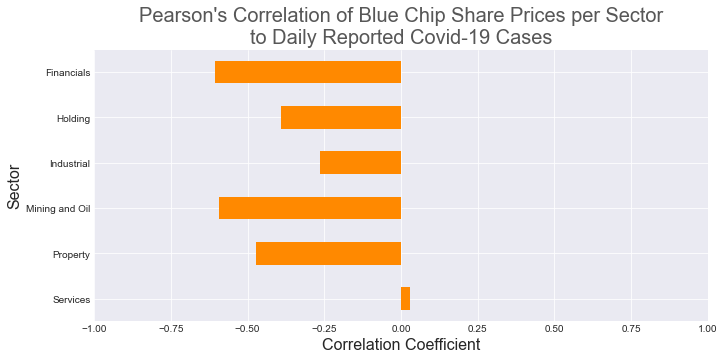

In [48]:
df_dict = {'Sector': [], 'Correlation Coefficient': []}
for key, df in dfs_sp_sectors_avg.items():
    df_temp = df.copy()
    df_temp['Covid-19 Daily Reported Cases'] = df_daily_cases
    df_dict['Sector'].append(key)
    df_dict['Correlation Coefficient'].append(df_temp['Mean'].corr(df_temp['Covid-19 Daily Reported Cases'], method='pearson'))
df_temp = pd.DataFrame(data=df_dict)
df_temp.sort_values('Sector', ascending=False, inplace=True)

corrcoeff_plotter(
    range(len(df_temp)),
    df_temp['Sector'].unique(),
    "Pearson's Correlation of Blue Chip Share Prices per Sector\nto Daily Reported Covid-19 Cases",
    20,
    (11,5),
    '#575757',
    16,
    "Correlation Coefficient",
    "Sector")

ax.get_figure().savefig('output2/covid19/corrcoeff-sectors.png')


#### h. Individual Sector Share Prices' Median and the Daily Reported Covid-19 Cases of the first half of 2020 (Scatterplot)

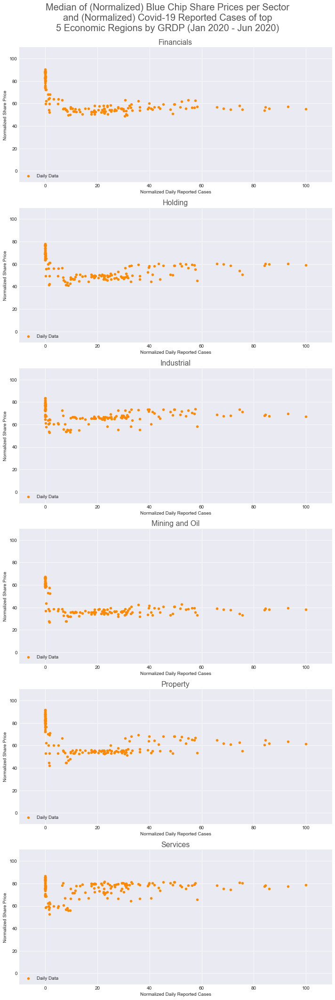

In [49]:
fig, axes = plt.subplots(6, 1, figsize=global_figsize_sectors)
counter = 0;

# print(len(axes))
for key, df in dfs_sp_sectors_avg.items():
    df_temp = df.copy()
    df_temp['Covid-19 Daily Reported Cases'] = df_daily_cases
    
    generic_plotter(df_temp,
    key,
    'Normalized Daily Reported Cases',
    'Normalized Share Price',
    x_lim=(-10,110),
    y_lim=[-10,110],
    label_fontsize=10,
    title_fontsize=16,
    kind='scatter',
    x='Covid-19 Daily Reported Cases',
    y='Median',
    label='Daily Data',
    figsize=None,
    ax=axes[counter],
    color=global_line_color)
    
    counter = counter + 1

fig.suptitle('Median of (Normalized) Blue Chip Share Prices per Sector\nand (Normalized) Covid-19 Reported Cases of top\n5 Economic Regions by GRDP (Jan 2020 - Jun 2020)', fontsize=20, color=global_title_color)
fig.tight_layout(rect=global_rect_sectors3)
fig.savefig('output2/covid19/scatter_median_share_price_per_sector_with_covid.png')


#### i. Sector Share Prices' Average and the Daily Reported Covid-19 Cases of the first half of 2020 (Scatterplot)

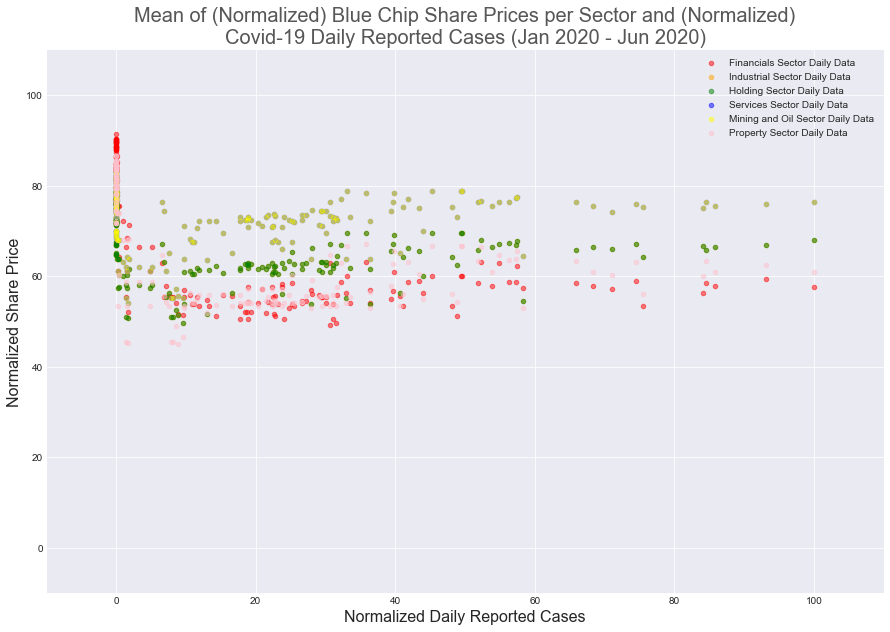

In [50]:
df_temp = df_daily_cases.copy()
df_temp.rename(columns={'Top 5 Economic Regions': 'Daily Reported Cases'}, inplace=True)
for key, df in dfs_sp_sectors_avg.items():
    df_temp[key] = df['Mean']
    
ax = scatterplot_all_sectors(df_temp,
f'Mean of (Normalized) Blue Chip Share Prices per Sector and (Normalized)\nCovid-19 Daily Reported Cases (Jan 2020 - Jun 2020)',
'Normalized Daily Reported Cases',
x_lim=(-10,110),
y_lim=(-10,110),
x_col='Daily Reported Cases',
alpha=0.5)

ax.get_figure().savefig('output2/covid19/scatter_mean_share_price_all_with_covid.png')

#### j. Sector Share Prices' Median and the Daily Reported Covid-19 Cases of the first half of 2020 (Scatterplot)

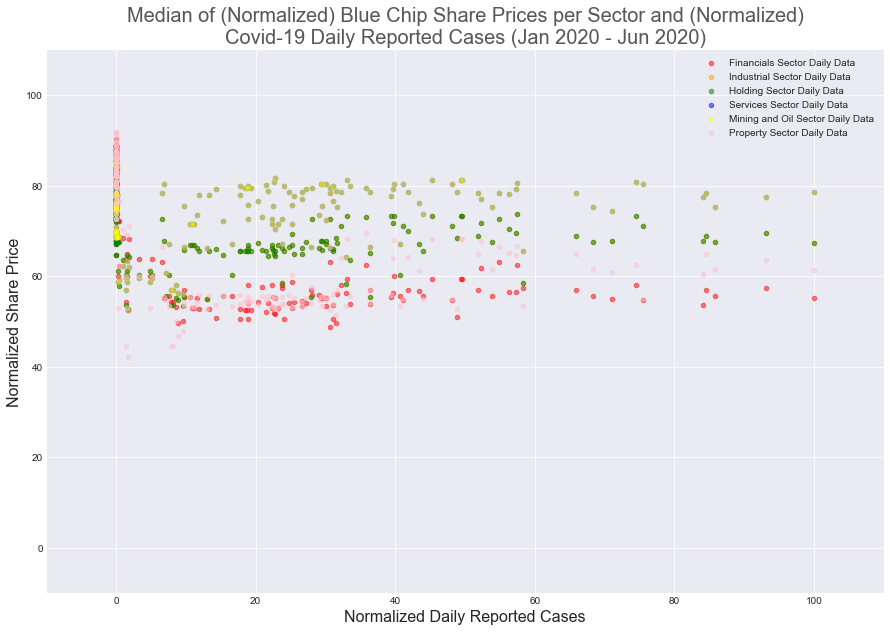

In [51]:
df_temp = df_daily_cases.copy()
df_temp.rename(columns={'Top 5 Economic Regions': 'Daily Reported Cases'}, inplace=True)
for key, df in dfs_sp_sectors_avg.items():
    df_temp[key] = df['Median']
    
ax = scatterplot_all_sectors(df_temp,
f'Median of (Normalized) Blue Chip Share Prices per Sector and (Normalized)\nCovid-19 Daily Reported Cases (Jan 2020 - Jun 2020)',
'Normalized Daily Reported Cases',
x_lim=(-10,110),
y_lim=(-10,110),
x_col='Daily Reported Cases',
alpha=0.5)

ax.get_figure().savefig('output2/covid19/scatter_median_share_price_all_with_covid.png')

#### k. Sector Share Prices' Central Tendencies and the Daily Reported Covid-19 Cases of the first half of 2020 (Scatterplot)

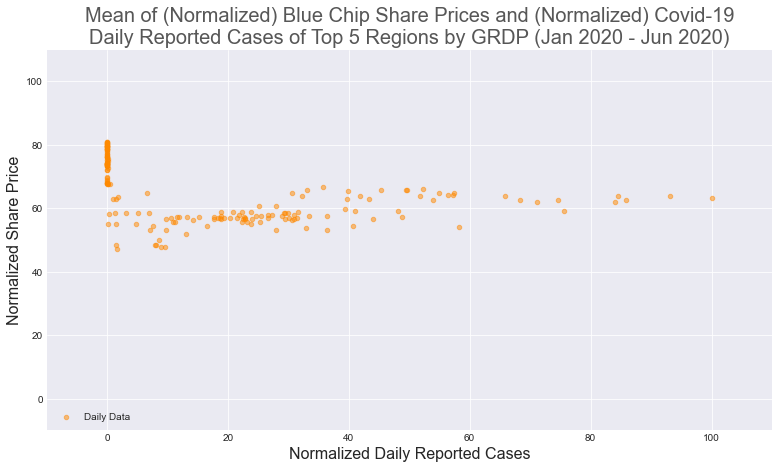

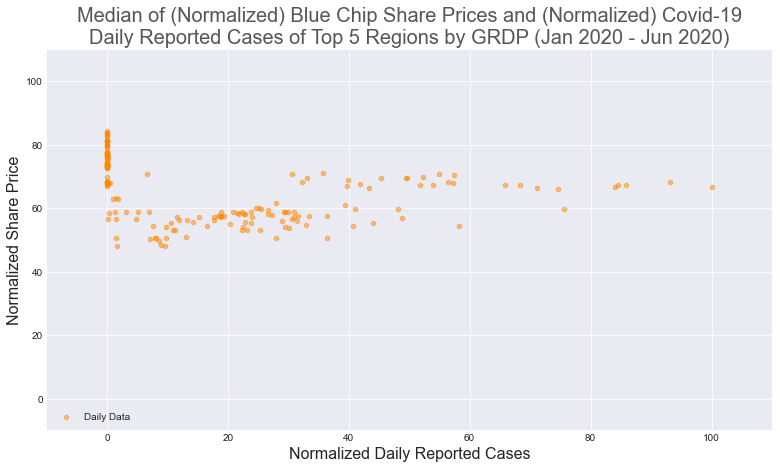

In [52]:
# PH as a whole
df_temp = pd.DataFrame(index=df_pse_shareprice.index)
df_temp['Mean'] = df_pse_shareprice.mean(axis=1)
df_temp['Median'] = df_pse_shareprice.median(axis=1)
df_temp['Covid-19 Daily Reported Cases'] = df_daily_cases

ax = generic_plotter(df_temp,
f'Mean of (Normalized) Blue Chip Share Prices and (Normalized) Covid-19\nDaily Reported Cases of Top 5 Regions by GRDP (Jan 2020 - Jun 2020)',
'Normalized Daily Reported Cases',
'Normalized Share Price',
x_lim=(-10,110),
y_lim=[-10,110],
figsize=(13, 7),
kind='scatter',
x='Covid-19 Daily Reported Cases',
y='Mean',
label='Daily Data',
alpha=0.5,
color=global_line_color)

ax.get_figure().savefig('output2/covid19/scatter_mean_all.png')

ax = generic_plotter(df_temp,
f'Median of (Normalized) Blue Chip Share Prices and (Normalized) Covid-19\nDaily Reported Cases of Top 5 Regions by GRDP (Jan 2020 - Jun 2020)',
'Normalized Daily Reported Cases',
'Normalized Share Price',
x_lim=(-10,110),
y_lim=[-10,110],
figsize=(13, 7),
kind='scatter',
x='Covid-19 Daily Reported Cases',
y='Median',
label='Daily Data',
alpha=0.5,
color=global_line_color)

ax.get_figure().savefig('output2/covid19/scatter_median_all.png')

#### l. Correlation Coefficient of the Mean of Blue Chip Share Prices and covid-19 Daily Reported Cases

In [53]:
df_temp = pd.DataFrame(index=df_pse_shareprice.index)
df_temp['Mean'] = df_pse_shareprice.mean(axis=1)
df_temp['Covid-19 Daily Reported Cases'] = df_daily_cases
print(f"Pearson's Correlation Coefficient: {df_temp['Mean'].corr(df_temp['Covid-19 Daily Reported Cases'], method='pearson')}")

Pearson's Correlation Coefficient: -0.40527955301290897


### B. Analysis

Correlations were done between the mean share prices of the different sectors of the Blue Chip companies and mean Covid-19 cases in the first two quarters using Pearson Correlation coefficient (r).  Examining the relationship between the Covid-19 cases and market share prices is important in determining if the pandemic has a direct influence on the market share prices, and indirectly on the economy of the Philippines. It should be noted that share prices in the different sectors were normalized to increase accuracy in getting the mean of the share prices per sector.

Overall, there was a negative correlation between market share prices and daily reported Covid-19 cases. This means that as Covid-19 cases increased, market share prices decreased. However, there were some Blue Chip companies that remained resilient (Figure 15) such as PLDT, Globe Telecom, Puregold, FGen, MPI and Ayala Corporation.

#### i. Financial

Share prices of the financial sector were the most affected during the pandemic. There was a negative and moderately strong association between market share prices in the Financial sector and Covid-19 cases (r = - 0.6). As Covid 19 cases increased, market share prices decreased. The Bayanihan to heal as one Act  implemented during the first two quarters allowed consumers to defer credit card and loan payments for two months. Debt restructuring and loan deferments during the two quarters could have affected the overall share prices of banks and weakened investor confidence.

It can be observed from the scatterplot that there was a linear relationship between Covid-19 daily reported cases and share prices of Blue Chips composing the financial sector.

#### ii. Holding

There was a low and negative correlation between the holding sector (r = -0.39) and Covid-19 cases. The rise in Covid-19 cases could have affected the public sentiment on large, holding or parent companies. In addition to weak investor confidence in the holding sector, the negative quarterly reports of these companies further dumped market prices. As daily reported cases of Covid-19 increased, share prices remained linear (seen from the scatterplot).

#### iii. Industrial

There was a very weak association between the industrial sector and covid-19 cases (r = -0.26). Industries, in general, still operated on reduced hours and work days. The continued operation might have buffered further drop in market share prices. There were no marked fluctuations in the normalized share prices of the Industrial sector compared to the daily reported Covid-19 cases (as seen from the scatterplot).

#### iv. Mining and Oil

The Mining sector (r = -0.59) also demonstrated a negative, moderately strong association with the rise in Covid-19 cases. The relationship between Covid-19 cases and the mining and oil sector was linear (as seen from the scatterplot).

#### v. Property

There was also a moderately strong but negative association between the property sector share prices and Covid-19 cases. This suggests that demand for property, whether for rental or ownership, reduced as Covid-19 cases continued to increase. There was a linear relationship between Covid-19 cases and share prices of the property sector (as seen from the scatterplot).

#### vi. Services

In contrast to other sectors, the service sector appeared to remain resilient in the first two quarters of the pandemic. There was a positive but  insignificant relationship between share prices of the service sector and rise in Covid-19 cases (r = 0.029). Although Covid-19 cases increased, market share prices of telecommunication and food companies breached or matched their pre-Covid-19 levels share prices. Relationship between Covid-19 cases and share prices of the services sector showed that as covid cases increased, share prices of the services sector remained high (as seen from the scatterplot).




## E. Quarantine Measures

### I. Load Quarantine Measures Data and Perform Wrangling

Assign weight (0 - 100) to the Quarantine Measures:
- NONE = 0
- MGCQ = 25
- GCQ = 50
- MECQ = 75
- ECQ - 100

The data extracted is the Daily Mode (Central Tendency) of Quarantine Measures of the Top 5 Regions by GRDP.

In [54]:
df_q_modes = pd.read_csv('datasets/quarantine_measures.csv')
df_q_modes = df_q_modes[['Date', 'mode', 'mode Q Code']].copy()
df_q_modes['date'] = pd.to_datetime(df_q_modes['Date'])
df_q_modes.drop(axis=1, columns=['Date'])

idx = pd.date_range('01-01-2020', '06-30-2020')
df_q_modes = df_q_modes.set_index(['date'])
df_q_modes = df_q_modes.reindex(idx, fill_value=0)

# data_with_q_mode = data.merge(data3_reindexed, how='outer', left_index=True, right_index=True)
df_q_modes['mode Q Code'].fillna(0, inplace=True)
df_q_modes['mode'].fillna('NONE', inplace=True)
df_q_modes['mode Q Code'] = df_q_modes['mode Q Code'].astype('uint8')

# Multiply all Q Codes with 25
df_q_modes['mode Q Code'] = df_q_modes['mode Q Code'] * 25

df_q_modes = df_q_modes[(df_q_modes.index.date > datetime.date(2019,12,31)) & (df_q_modes.index.date < datetime.date(2020,7,1))]
# print(data_with_q_mode)

### II. Visualization

#### a. Quarantine Timeline (Area Graph)

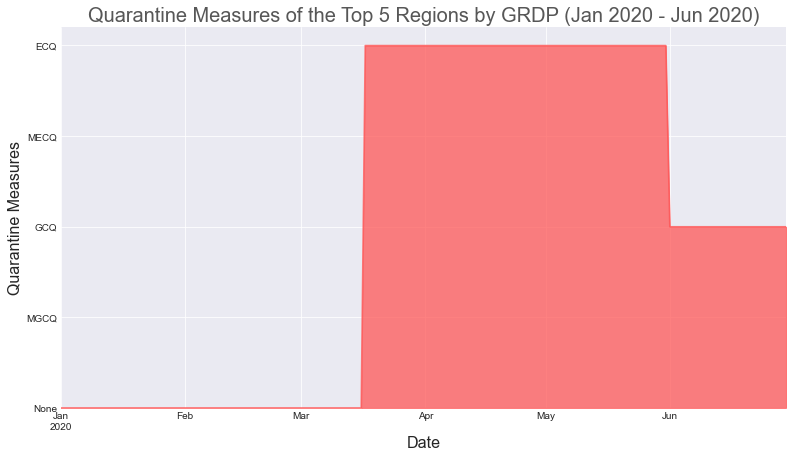

In [55]:
ax = generic_plotter(
    df_q_modes, 
    'Quarantine Measures of the Top 5 Regions by GRDP (Jan 2020 - Jun 2020)',
    'Date',
    'Quarantine Measures',
    kind='area',
    color=global_q_color,
    figsize=(13,7),
    legend=False,
    alpha = 0.75)

ax.set_yticks([0, 25, 50, 75, 100])
ax.set_yticklabels(['None', 'MGCQ', 'GCQ', 'MECQ', 'ECQ'])

ax.get_figure().savefig('output2/q_modes/q_measures.png')



#### b. Individual Blue Chip Share Prices with Quarantine Timeline (Line Graph)

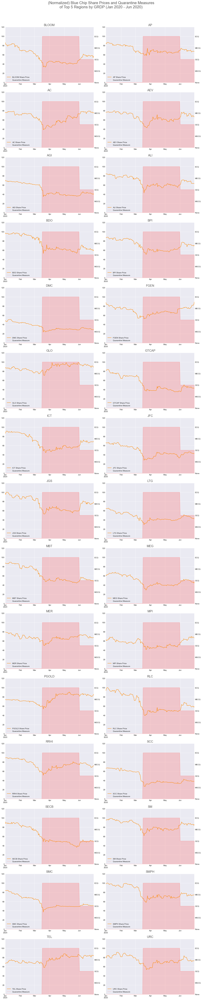

In [56]:
def plot_q_mode_and_shareprice(df, title, df_q_modes, ax=None, **kwargs):
    if ax is not None:
        generic_plotter(df, title, y_lim=[0,120], color=global_line_color, ax=ax, figsize=None,
        label_fontsize=10, title_fontsize=16, legend_loc='upper left')
        
        ax = generic_plotter(
        df_q_modes, 
        title,
        figsize=None,
        ax=ax,
        kind='area',
        alpha=0.25,
        color=global_q_color,
        label_fontsize=10,
        title_fontsize=16, 
        **kwargs)
        
    else:
        ax = generic_plotter(df, title, 'Date', 'Normalized Values', y_lim=[0,120]) 
    
        ax = generic_plotter(
        df_q_modes, 
        title,
        'Date',
        'Normalized Values',
        ax=ax,
        kind='area',
        alpha=0.25,
        color='#FF5757',
        label='Quarantine Measures',
        **kwargs)
    
    ax = set_quarantine_mode_index(ax, with_label=False)
    
    return ax

fig, axes = plt.subplots(15, 2, figsize=global_figsize_all)
counter = 0;

for col in df_pse_shareprice.columns:
    df = df_pse_shareprice[col].copy().to_frame()
    cols_dict = {}
    cols_dict[col] = f'{col} Share Price'
    df.rename(columns=cols_dict, inplace=True)
    
    # title = f'Normalized {col} Shareprice and Quarantine Measures of top 5 Economic Regions during the First 2 Quarters of 2020'
    ax = plot_q_mode_and_shareprice(df, col, df_q_modes, ax=axes[int(floor(counter / 2)), int(counter % 2)])
    ax.legend([f'{col} Share Price', 'Quarantine Measure'], loc='lower left')
    # ax.get_figure().savefig(f'Output/Quarantine Measures/shareprice_{col}.png')
    
    counter = counter + 1

fig.suptitle('(Normalized) Blue Chip Share Prices and Quarantine Measures\nof Top 5 Regions by GRDP (Jan 2020 - Jun 2020)', fontsize=20, color=global_title_color)
fig.tight_layout(rect=global_rect_all)
fig.savefig('output2/q_modes/share_prices_all_with_q_measure.png')


#### c. Central Tendencies of the individual Sectors' Share Prices with Quarantine Timeline (Line Graph)

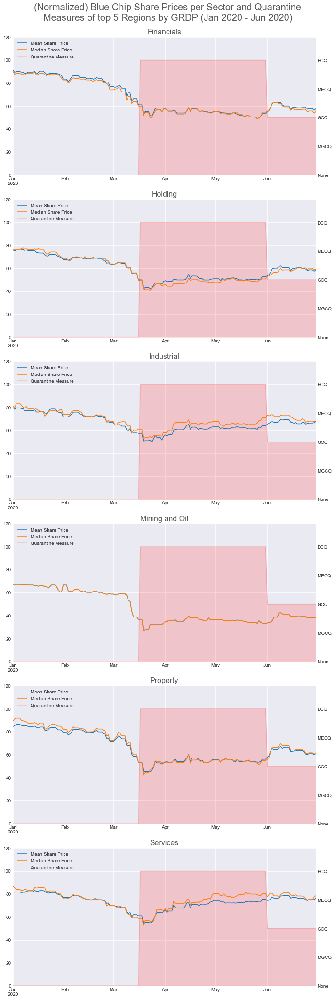

In [57]:
def plot_q_mode_and_shareprice(df, title, df_q_modes, ax=None, **kwargs):
    if ax is not None:
        generic_plotter(df, title, y_lim=[0,120], ax=ax, figsize=None,
        label_fontsize=10, title_fontsize=16, legend_loc='upper left')
        
        ax = generic_plotter(
        df_q_modes, 
        title,
        figsize=None,
        ax=ax,
        kind='area',
        alpha=0.25,
        color=global_q_color,
        label_fontsize=10,
        title_fontsize=16, 
        **kwargs)
        
    else:
        ax = generic_plotter(df, title, 'Date', 'Normalized Values', y_lim=[0,120]) 
    
        ax = generic_plotter(
        df_q_modes, 
        title,
        'Date',
        'Normalized Values',
        ax=ax,
        kind='area',
        alpha=0.25,
        color='#FF5757',
        label='Quarantine Measures',
        **kwargs)
    
    ax = set_quarantine_mode_index(ax, with_label=False)
    
    return ax

fig, axes = plt.subplots(6, 1, figsize=global_figsize_sectors)
counter = 0;

for key, df in dfs_sp_sectors_avg.items():
    df = df.copy()
    ax = plot_q_mode_and_shareprice(df, key, df_q_modes, ax=axes[counter])
    ax.legend(['Mean Share Price', 'Median Share Price', 'Quarantine Measure'], loc="upper left")
    counter = counter + 1
    

fig.suptitle('(Normalized) Blue Chip Share Prices per Sector and Quarantine\nMeasures of top 5 Regions by GRDP (Jan 2020 - Jun 2020)', fontsize=20, color=global_title_color)
fig.tight_layout(rect=global_rect_sectors2)
fig.savefig('output2/q_modes/share_prices_per_sector_with_q_measure.png')


#### d. Central Tendencies of Blue Chip Share Prices with Quarantine Timeline

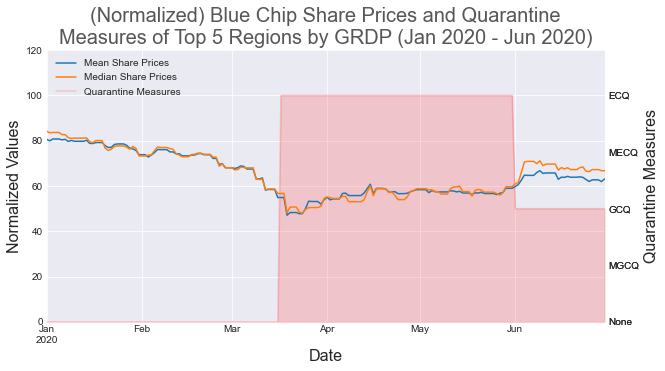

In [58]:
def plot_q_mode_and_shareprice(df, title, df_q_modes, ax=None, **kwargs):
    if ax is not None:
        generic_plotter(df, title, y_lim=[0,120], ax=ax, figsize=None,
        label_fontsize=10, title_fontsize=16, legend_loc='upper left')
        
        ax = generic_plotter(
        df_q_modes, 
        title,
        figsize=None,
        ax=ax,
        kind='area',
        alpha=0.25,
        color=global_q_color,
        label_fontsize=10,
        title_fontsize=16, 
        **kwargs)
        
    else:
        ax = generic_plotter(df, title, 'Date', 'Normalized Values', y_lim=[0,120]) 
    
        ax = generic_plotter(
        df_q_modes, 
        title,
        'Date',
        'Normalized Values',
        ax=ax,
        kind='area',
        alpha=0.25,
        color='#FF5757',
        label='Quarantine Measures',
        **kwargs)
    
    ax = set_quarantine_mode_index(ax, with_label=False)
    
    return ax

# PH as a whole
df_temp = pd.DataFrame(index=df_pse_shareprice.index)
df_temp['Mean'] = df_pse_shareprice.mean(axis=1)
df_temp['Median'] = df_pse_shareprice.median(axis=1)
ax = plot_q_mode_and_shareprice(
    df_temp,
    '(Normalized) Blue Chip Share Prices and Quarantine\nMeasures of Top 5 Regions by GRDP (Jan 2020 - Jun 2020)',
    df_q_modes,
    figsize=(10,5)
)
ax = set_quarantine_mode_index(ax)
ax.legend(['Mean Share Prices', 'Median Share Prices', 'Quarantine Measures'], loc="upper left")
ax.get_figure().savefig('output2/q_modes/share_prices_with_q_measures.png')

#### e. Individual Blue Chip Share Prices with Quarantine Timeline (Scatterplot)

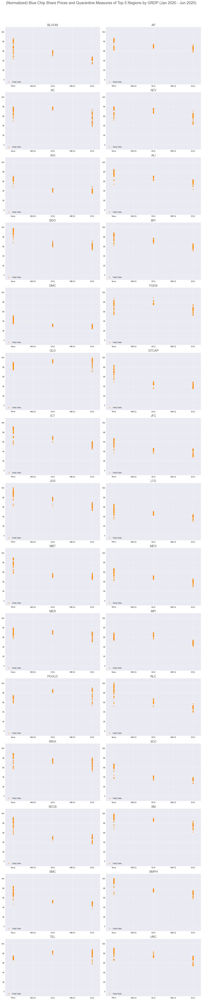

In [59]:
fig, axes = plt.subplots(15, 2, figsize=global_figsize_all)
counter = 0;

for col in df_pse_shareprice.columns:
    df = generate_quarantine_shareprice_data(df_pse_shareprice, col, df_q_modes['mode Q Code'])
    
    ax = generic_plotter(df,
    col,
    x_lim=(-10,110),
    y_lim=[-10,110],
    label_fontsize=10,
    title_fontsize=16,
    kind='scatter',
    x='Quarantine Measures',
    y=col,
    x_label='',
    y_label='',
    figsize=None,
    ax=axes[int(floor(counter / 2)), int(counter % 2)],
    alpha = 0.5,
    color=global_line_color,
    label='Daily Data')
    
    set_quarantine_mode_scatter_index(ax, 10, False)
    
    counter = counter + 1
    
    # ax.get_figure().savefig(f'Output/Quarantine Measures/scatter_share_{col}.png')

fig.suptitle('(Normalized) Blue Chip Share Prices and Quarantine Measures of Top 5 Regions by GRDP (Jan 2020 - Jun 2020)', fontsize=20, color=global_title_color)
fig.tight_layout(rect=global_rect_all)
fig.savefig('output2/q_modes/scatter_share_price_all_with_q_measures.png')



#### f. Mean of each Individual Sectors' Blue Chip Share Prices with Quarantine Timeline (Scatterplot)

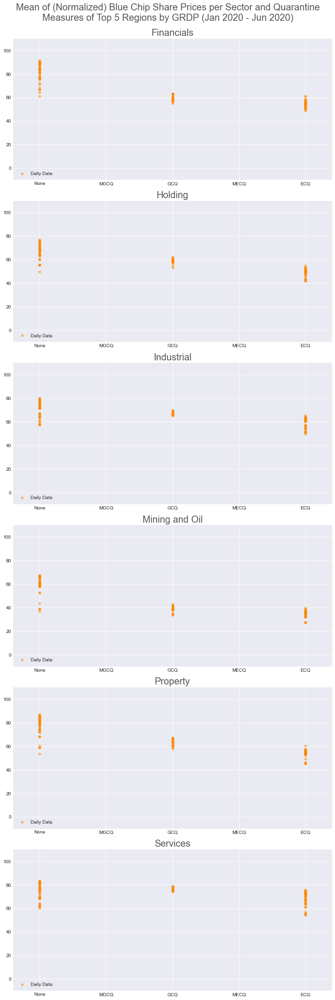

In [60]:
fig, axes = plt.subplots(6, 1, figsize=global_figsize_sectors)
counter = 0;

for key, df in dfs_sp_sectors_avg.items():
    df_temp = df.copy()
    df_temp['Quarantine Measures'] = df_q_modes['mode Q Code']
    
    ax = generic_plotter(df_temp,
    key,
    x_lim=(-10,110),
    y_lim=[-10,110],
    kind='scatter',
    x='Quarantine Measures',
    y='Mean',
    x_label='',
    y_label='',
    figsize=None,
    ax=axes[counter],
    alpha = 0.5,
    color=global_line_color,
    label='Daily Data')
    
    set_quarantine_mode_scatter_index(ax, 10, False)
    
    counter = counter + 1
    
    # ax.get_figure().savefig(f'Output/Quarantine Measures/scatter_share_{col}.png')

fig.suptitle('Mean of (Normalized) Blue Chip Share Prices per Sector and Quarantine\nMeasures of Top 5 Regions by GRDP (Jan 2020 - Jun 2020)', fontsize=20, color=global_title_color)
fig.tight_layout(rect=global_rect_sectors2)
fig.savefig('output2/q_modes/scatter_mean_share_price_per_sector_with_q_measures.png')


#### g. Median of each Individual Sectors' Blue Chip Share Prices with Quarantine Timeline (Scatterplot)

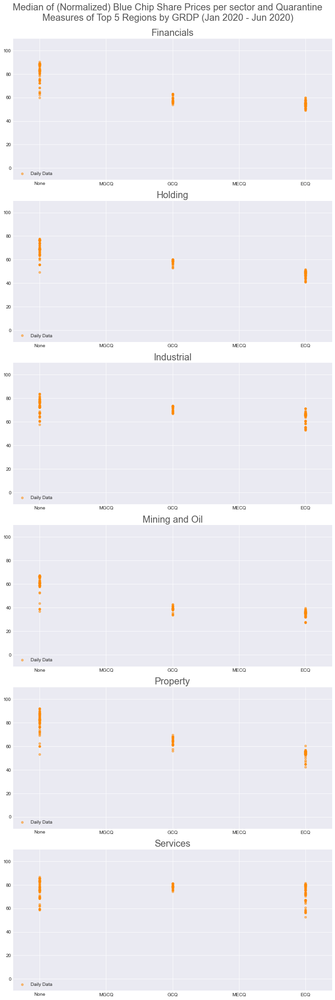

In [61]:
fig, axes = plt.subplots(6, 1, figsize=global_figsize_sectors)
counter = 0;

for key, df in dfs_sp_sectors_avg.items():
    df_temp = df.copy()
    df_temp['Quarantine Measures'] = df_q_modes['mode Q Code']
    
    ax = generic_plotter(df_temp,
    key,
    x_lim=(-10,110),
    y_lim=[-10,110],
    kind='scatter',
    x='Quarantine Measures',
    y='Median',
    x_label='',
    y_label='',
    figsize=None,
    ax=axes[counter],
    alpha = 0.5,
    color=global_line_color,
    label='Daily Data')
    
    set_quarantine_mode_scatter_index(ax, 10, False)
    
    counter = counter + 1
    
    # ax.get_figure().savefig(f'Output/Quarantine Measures/scatter_share_{col}.png')

fig.suptitle('Median of (Normalized) Blue Chip Share Prices per sector and Quarantine\nMeasures of Top 5 Regions by GRDP (Jan 2020 - Jun 2020)', fontsize=20, color=global_title_color)
fig.tight_layout(rect=global_rect_sectors2)
fig.savefig('output2/q_modes/scatter_median_share_price_per_sector_with_q_measures.png')



#### h. Central Tendencies of each Sectors' Blue Chip Share Prices with Quarantine Timeline (Scatterplot)

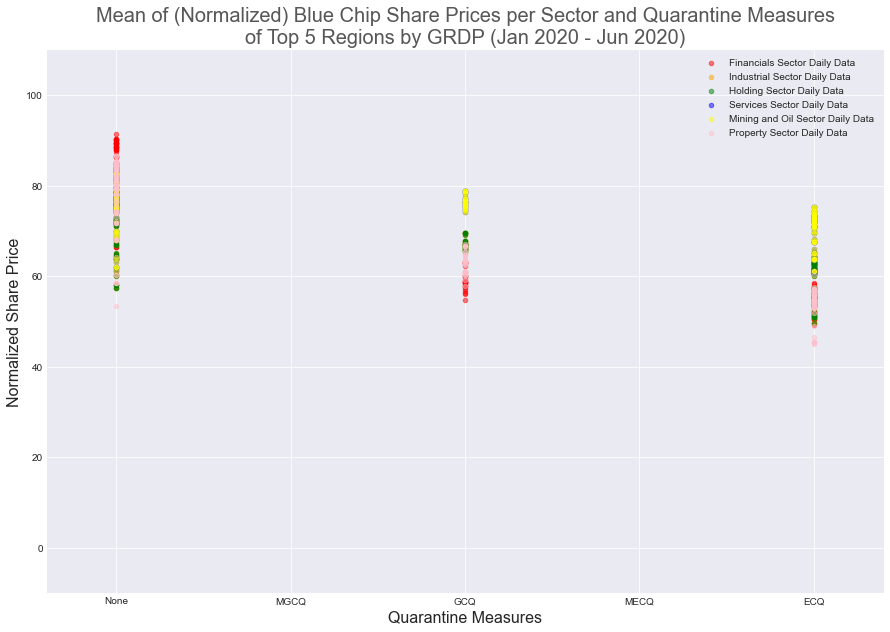

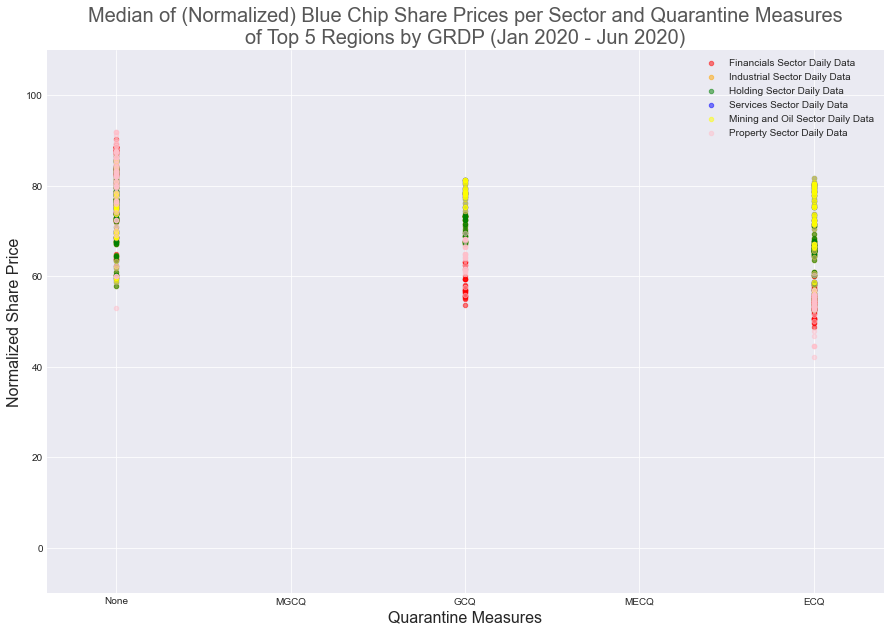

In [62]:
df_temp = df_q_modes[['mode Q Code']].copy()
df_temp.rename(columns={'mode Q Code': 'Quarantine Measures'}, inplace=True)
for key, df in dfs_sp_sectors_avg.items():
    df_temp[key] = df['Mean']
    
ax = scatterplot_all_sectors(df_temp,
f'Mean of (Normalized) Blue Chip Share Prices per Sector and Quarantine Measures\nof Top 5 Regions by GRDP (Jan 2020 - Jun 2020)',
'Quarantine Measures',
x_col='Quarantine Measures',
x_lim=(-10,110),
y_lim=[-10,110])

set_quarantine_mode_scatter_index(ax)

ax.get_figure().savefig(f'output2/q_modes/scatter_mean_all_sectors_share_price_all.png')


df_temp = df_q_modes[['mode Q Code']].copy()
df_temp.rename(columns={'mode Q Code': 'Quarantine Measures'}, inplace=True)
for key, df in dfs_sp_sectors_avg.items():
    df_temp[key] = df['Median']
    
ax = scatterplot_all_sectors(df_temp,
f'Median of (Normalized) Blue Chip Share Prices per Sector and Quarantine Measures\nof Top 5 Regions by GRDP (Jan 2020 - Jun 2020)',
'Quarantine Measures',
x_col='Quarantine Measures',
x_lim=(-10,110),
y_lim=[-10,110])

set_quarantine_mode_scatter_index(ax)

ax.get_figure().savefig(f'output2/q_modes/scatter_median_all_sectors_share_price_all.png')

#### i. Central tendencies of Blue Chip Share Prices with Quarantine Timeline (Scatterplot)

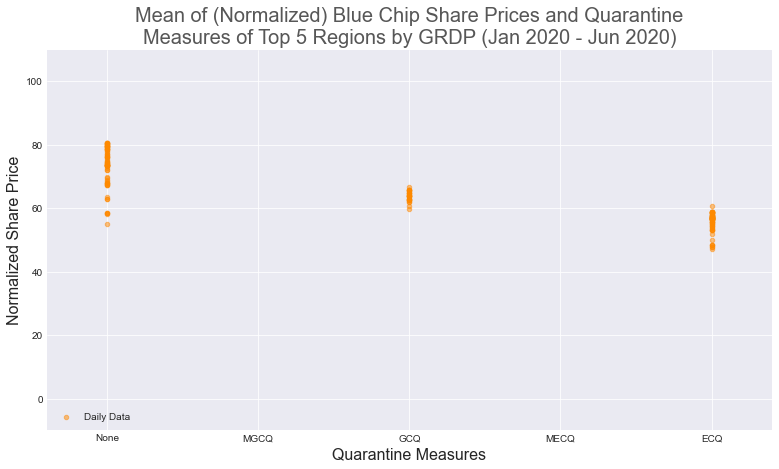

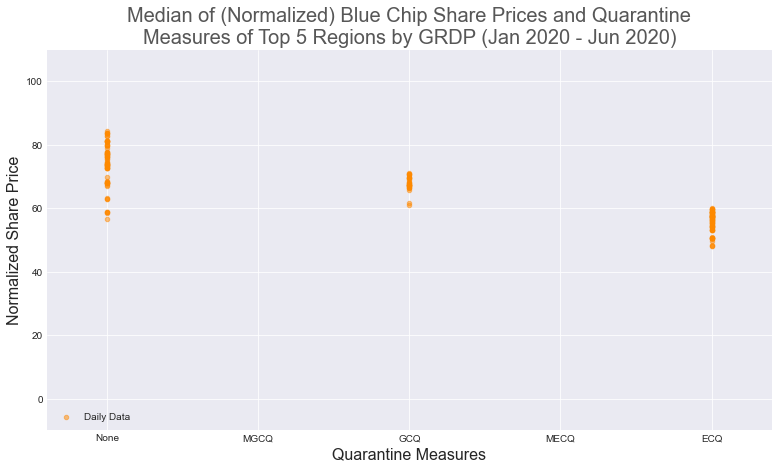

In [63]:
# PH as a whole
df_temp = pd.DataFrame(index=df_pse_shareprice.index)
df_temp['Mean'] = df_pse_shareprice.mean(axis=1)
df_temp['Median'] = df_pse_shareprice.median(axis=1)
df_temp['Quarantine Measures'] = df_q_modes[['mode Q Code']].copy()

ax = generic_plotter(df_temp,
f'Mean of (Normalized) Blue Chip Share Prices and Quarantine\nMeasures of Top 5 Regions by GRDP (Jan 2020 - Jun 2020)',
'Quarantine Measures',
'Normalized Share Price',
x_lim=(-10,110),
y_lim=[-10,110],
kind='scatter',
x='Quarantine Measures',
y='Mean',
label='Daily Data',
color=global_line_color,
alpha=0.5,
figsize=(13,7))

set_quarantine_mode_scatter_index(ax)

ax.get_figure().savefig('output2/q_modes/scatter_mean_all.png')





ax = generic_plotter(df_temp,
f'Median of (Normalized) Blue Chip Share Prices and Quarantine\nMeasures of Top 5 Regions by GRDP (Jan 2020 - Jun 2020)',
'Quarantine Measures',
'Normalized Share Price',
x_lim=(-10,110),
y_lim=[-10,110],
kind='scatter',
x='Quarantine Measures',
y='Median',
label='Daily Data',
color=global_line_color,
alpha=0.5,
figsize=(13,7))

set_quarantine_mode_scatter_index(ax)

ax.get_figure().savefig('output2/q_modes/scatter_median_all.png')

### III. Analysis

Correlations between the market share prices of the different sectors in the PSEi and quarantine measures were not established since quarantine measures were categorical and market share prices were continuous data. However, as quarantine measures eased, market share prices increased. In contrast, when the strictest form of quarantine was imposed, market share prices generally went down. The easing of lockdowns allowed more economic activities, which in turn might have fueled positive public sentiments and confidence in the stock market. These observations, however, should be taken with caution since these were only based on the market trend and quarantine measures imposed.